# Assignment #4 - Reinforcement Learning

### <font color="red"> DUE: Nov 26 (Tuesday) 11:00 pm </font>  

<font color="blue"> Siddhi Degaonkar </font>

# I. Overview

* Purpose and Objective of this assignment:
In Asssignment #4 , we are trying to learn and implement Reinforcement Learning for Game Rummy. We are going to do so implementing Temporal Difference Learning. TD is an unsupervised technique in which the learning agent learns to predict the expected value of a variable occurring at the end of a sequence of states. Reinforcement learning (RL) extends this technique by allowing the learned state-values to guide actions which subsequently change the environment state. TD learning has two approaches namely SARSA and Q learning. In this assignment we are going to study what is SARSA and Q learning and its advantages and then used it to implement and accomplish the goal of designing the Rummy Game.

# II. Problems 



## Rummy (Our Way)
![](https://upload.wikimedia.org/wikipedia/commons/9/9a/3_playing_cards.jpg)



### Description:
Rummy is mostly played by 4 players where each player get 10 cards and rest of placed as closed deck.  

But for this assignment to keep it simple, we have changed some rules, reduced the deck of cards and distribution of the cards among each player. Otherwise, the our Q table would be large to handle on our local machines.  

So in this game each player will get 3 cards randomly from 'A' to '5'. With each turn you have to pick a card either from the pile of closed or open cards depending on the cards you have. After that you have to select a card to drop to the pile from your deck. Your goal is to make all of your 3 cards of same number. As soon as one player reaches the goal state, it will meld the cards and game will stop and all other player will get score as the sum of their cards in hand. Player with minimum score will win the game.  

Each player will play for the 10 rounds and if nobody reach to the meld stage then each will player will get score equivalent to the sum of their cards in hand.

Player with the lowest score wins the game.



### <font color="red"> Game Introduction and Rules: </font>

You can only till max turns which is now 20. If you are able to meld your cards, you win otherwise you lose points as per your stash score.

Lets Simulate a Game Round :
The Goal of this game is to collect cards with the same rank.
Naming Conventions to follow H : Hearts, S : Spades, D : Diamonds, C : Clubs. Stash/Hand are the cards which you have. Stash/Hand Score: The sum of the rank of cards. 

- On the first turn you will be given 3 cards from the randomly shuffled deck. Eg: 3H, 2S, AD. Stash Score: 6
- In the next step you will have to either pick a card from pile or the deck. On the first turn, the top card of the deck is on the pile. The card on the pile is visible to you. So Card on the Pile : 2D . You have to decide whether you have to pick this card or you have to pick from pile. Since you alread
- Following the pickup step, you will have to drop one card from the stash/hand. Your Hand : 3H, 2S, AD, 2D
- You can drop any of these cards, but remember if you drop 2S or 2D you might not be able to make a series. So you have to decide whether to drop 3H or AD. Since there are maximum 20 turns, you have to keep your score low as well, Higher the score the higher points you lose. So you decide to drop 3H. Your hand/stash will be: 2S, 2D, AD
- Your opponent will play his hand, he/she shall pick up a card from a pile or deck and the drop a card to the pile.
- Now its your turn. The card on the Pile : 5H. Since picking up this card won't help you much. You decide to pick a card from the Deck. You get lucky, you get a 2C card. Your hand now is 2S, 2D, 2C, AD. Hurray! You can now meld these cards and drop the last card to make your score 0.
- You win this round. Your opponent Stash/Hand score : 15. So you are at 0 points and your opponent is at 15 points. You are ahead of him since you have to keep your score as low as possible.


## Rummy Environment

Importing Libraries

In [1]:
import random
from functools import reduce
from collections import defaultdict
import numpy as np
from copy import copy
import random
from statistics import mean
import matplotlib.pyplot as plt
import pdb
import seaborn as sns

%matplotlib inline

Here, we define the SUITS, RANKS of the cards and their RANK_VALUE.

In [2]:
SUIT = ['H','S','D','C']
RANK = ['A', '2', '3', '4', '5','6','7']
RANK_VALUE = {'A': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'T': 10, 'Q': 10, 'K': 10}

## Card Class Definition
__init__  : Defines the card details such as rank, suit and calculates the rank value


In [3]:
class Card :
    def __init__(self,rank,suit):
        self.rank = rank
        self.suit = suit
        self.rank_to_val = RANK_VALUE[self.rank]
    
    def __str__(self):
        return f'{self.rank}{self.suit}'

    def __repr__(self):
        return f'{self.rank}{self.suit}'

    
    def __eq__(self,other):
        return self.rank == other.rank and self.suit == other.suit
  
# Deck class contains some basic operations performed with the cards:
# 1. Shuffling the cards.
# 2. Drawing card from the deck.

## Deck Class Definition
__shuffle__ : Shuffles the deck in random order

__draw_card__ : Draws a card from the top of the deck

In [4]:
class Deck:
    def __init__(self,packs):
        self.packs = packs
        self.cards = []
        for pack in range(0,packs) :
            for suit in SUIT :
                for rank in RANK :
                    self.cards.append(Card(rank,suit))
    
    def shuffle(self):
        random.shuffle(self.cards)
    
    def draw_card(self):
        card = self.cards[0]
        self.cards.pop(0)
        return card

## Player Class:

### 1.__init__(self,name,stash=list(),isBot=False): 
Initializing stash, name, isBot/dealer points for each player.

### 2. deal_card(self,card):
This method appends the card in the stash and check the condition that length of stash should not be greater than nuber of cards length in game.

### 3. drop_card(self,card):
This method removes the card from stash and add that card into pile.

### 4. meld(self):
This method tries to find the cards with the same rank in the hand. If it finds then it will merge the cards in the hand to the melded cards array in the game. 

### 5. stash_score(self):
This method calculates sum of all the cards in stash according to the rank of each card.

### 6. get_info(self,debug):
This function fetch all the information of the player.

In [5]:
class Player:
  
    """  
        Player class to create a player object.
        eg: player = Player("player1", list(), isBot = False)
        Above declaration will be for your agent.
        All the player names should be unique or else you will get error.
        
    """

    def __init__(self,name,stash=list(),isBot=False,points=0,conn=None):
        self.stash = stash
        self.name = name
        self.game = None
        self.isBot = isBot
        self.points = points
        self.conn = conn
        
    def deal_card(self,card):
        try :
            self.stash.append(card)
            if len(stash) > self.game.cardsLength + 1 :
                raise ValueError('Cannot have cards greater than ')
        except ValueError as err:
            print(err.args)
            
    def drop_card(self,card):
        self.stash.remove(card)
        self.game.add_pile(card)
        return -1

    
    def meld(self):
        card_hash = defaultdict(list)
        for card in self.stash:
            card_hash[card.rank].append(card)
        melded_card_ranks = []
        for (card_rank,meld_cards) in card_hash.items():
            if len(meld_cards) >= 3 :
                self.game.meld.append(meld_cards)
                melded_card_ranks.append(card_rank)
                for card in meld_cards:
                    self.stash.remove(card)
        
        for card_rank in melded_card_ranks :
            card_hash.pop(card_rank)
        return len(melded_card_ranks) > 0

    def stash_score(self) :
        score = 0
        for card in self.stash :
            score += RANK_VALUE[card.rank]
        return score
    
    def get_info(self,debug):
        if debug :
            print(f'Player Name : {self.name} \n Stash Score: {self.stash_score()} \n Stash : {", ".join(str(x) for x in self.stash)}')
        card_ranks = []
        card_suits = []
        pileset = None
        pile = None
        for card in self.stash :
            card_suits.append(RANK_VALUE[card.rank])
            card_ranks.append(card.suit)
        if len(self.game.pile) > 0 : 
            return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks, "PileRank": self.game.pile[-1].rank, "PileSuit":self.game.pile[-1].suit}
        return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks}


## Game Enviroment:

### 1. __init():  

### 2. add_pile(self, card):  This method takes a card as argument and first checks number of cards in the deck. If its is ‘0’ then add the cards from file to deck and append the passed card to the pile.

### 3. pick_card(self, player, action):  This methods helps player picking up the card from either Pile or Deck based on action.
			We have defined, If action = 0 then, player will pick a card from Pile
			And if action. = 1 then player will pick card from Deck. 
			Meld condition will be check after player picks the card, if the meld condition satisfied, player won. 
            You can modify the rewards in return, only the values

### 4. pick_from_pile(self, player): This method helps player picking card from the pile and simultaneously a card from pile gets reduced.

### 5. pick_from_deck(self, player): This method is similar to above method but it helps picking up card from the Deck. 

### 6. get_player(self, player_name): This function fetch the details of the player given player_name.

### 7. computer_play(self, player): This method defines the play of the computer/Dealer in following sequence:
			--> Randomly taking actions from picking up card from deck/pile.
			--> Checking the meld condition afterwards.
			--> If the meld condition does not satisfied, remove the card from his stash.

### 8. play(self): This method defines all the function city of play for the player:
		  --> Decrementing the maximum number of turns defined per game.
		  --> For each player, it will check the 'stash', if the 'Stash' for any player = 0 (That player won), it will add the value of each card in stash for all other players.
		  --> Or If maximum number of turns in each round becomes 0, it will add the card values in stash for all the players and return.
      
### 9. drop_card(self,player,card) This method drops a card from the player given player object and card object and returns the reward associated with it.

      --> You can modify the rewards which gets returned in the value.


### 9. reset(self, players): This method will reinitialize all the deck, pile and players.

### 10. _update_turn(self): This method is used to count the number of turns in the game.

In [6]:
class RummyAgent() :
    """
    Simple Rummy Environment
    
    Simple Rummy is a game where you need to make all the cards in your hand same before your opponent does.
    Here you are given 3 cards in your hand/stash to play.
    For the first move you have to pick a card from the deck or from the pile. 
    The card in deck would be random but you can see the card from the pile.
    In the next move you will have to drop a card from your hand.
    Your goal is to collect all the cards of the same rank. 
    Higher the rank of the card, the higher points you lose in the game. 
    You need to keep the stash score low. Eg, if you can AH,7S,5D your strategy would be to either find the first pair of the card or by removing the highest card in the deck.
    You only have 20 turns to either win the same or collect low scoring card.
    You can't see other players cards or their stash scores.
    
    Parameters
    ====
    players: Player objects which will play the game.
    max_card_length : Number of cards each player can have
    max_turns: Number of turns in a rummy game
    """

    def __init__(self,players,max_card_length=5,max_turns=20) :
        self.max_card_length = max_card_length
        self.max_turns = max_turns
        self.reset(players)
        
    def update_player_cards(self,players):
        for player in players :
            player = Player(player.name,list(),isBot=player.isBot,points=player.points,conn=player.conn)
            stash = []
            for i in range(self.max_card_length):
                player.stash.append(self.deck.draw_card())
            player.game = self
            self.players.append(player)
        self.pile = [self.deck.draw_card()]

    def add_pile(self,card):
        if len(self.deck.cards) == 0 :
            self.deck.cards.extend(self.pile)
            self.deck.shuffle()
            self.pile = []
        self.pile.append(card)
        
        
    def pick_card(self,player,action):
        if action == 0:
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
        if player.meld() :
            return {"reward" : 10}
        else :
            return {"reward" : -1}
#             return -player.stash_score()
       
    def pick_from_pile(self,player):
        card = self.pile[-1]
        self.pile.pop()
        return player.stash.append(card)
     
    def pick_from_deck(self,player):
        return player.stash.append(self.deck.draw_card())
    
    def get_player(self,player_name):
        return_player = [player for player in self.players if player.name == player_name]
        if len(return_player) != 1:
            print("Invalid Player")
            return None
        else:
            return return_player[0]
    
    def drop_card(self,player,card):
        player.drop_card(card)
        return {"reward" : -1}
    
  
    def computer_play(self,player):
        #Gets a card from deck or pile
        if random.randint(0,1) == 1 :
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
            
        #tries to meld if it can
#         if random.randint(0,10) > 5 :
        player.meld()
        
        #removes a card from the stash
        if len(player.stash) != 0:
            card = player.stash[(random.randint(0,len(player.stash) - 1))]
            player.drop_card(card)
        
    def play(self):
        for player in self.players :
            if len(player.stash) == 0 :
                return True
        if self.max_turns <= 0 :
            return True
        return False

    def _update_turn(self):
        self.max_turns -= 1  
    
    def reset(self,players,max_turns=20):
        self.players = []
        self.deck = Deck(1)
        self.deck.shuffle()
        self.meld = []
        self.pile = []
        self.max_turns = max_turns
        self.update_player_cards(players)




### Example Run with Random Players

This following code shows how to create an environment and players to play 10 games with 20 maximum rounds. This only includes random picking up of card and dropping.  

In [7]:
p1 = Player('siddhi',list())
p2 = Player('comp1',list(),isBot=True)
rummy = RummyAgent([p1,p2],max_card_length=3,max_turns=20)

In [8]:
maxiter = 3
debug = True
for j in range(maxiter):
        for player in rummy.players :
            player.points = player.stash_score()
        
        rummy.reset(rummy.players)
        random.shuffle(rummy.players)
        # int i = 0 
        if debug :
            print(f'**********************************\n\t\tGame Starts : {j}\n***********************************')
        while not rummy.play() :    
            rummy._update_turn()
            print(rummy.max_turns)       
            for player in rummy.players:
                if player.isBot :
                    if rummy.play():
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    rummy.computer_play(player)
                    if debug :
                        player.get_info(debug)
                        if player.stash == 0 :
                            print(f'{player.name} wins the round')

                else :
                    if rummy.play() :
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    player_info = player.get_info(debug)
                    action_taken = np.random.choice(1)
                    if debug :
                        print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')
                    result_1 = rummy.pick_card(player,action_taken)
                    result_1 = result_1["reward"]

                    if debug : 
                        print(f'{player.name} takes action {action_taken}')
                    #player stash will have no cards if the player has melded them 
                    #When you have picked up a card and you have drop it since the remaining cards have been melded. 
                    if len(player.stash) == 1:
                        rummy.drop_card(player,player.stash[0])
                        if debug :
                            print(f'{player.name} Wins the round')

                    elif len(player.stash) != 0 :

                        player_info = player.get_info(debug)
                        s = player_info['CardRanks']
                        action_taken = np.random.choice(4)
                        card = player.stash[action_taken]
                        if debug :
                            print(f'{player.name} drops card {card}')

                        result_1 = rummy.drop_card(player,card)
                        result_1 = result_1["reward"]
#                             pdb.set_trace()
                    else :
                        if debug :
                            print(f'{player.name} Wins the round')
                    if debug :
                        player.get_info(debug)
        


**********************************
		Game Starts : 0
***********************************
19
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 4H, 6S, 7C
siddhi Plays
Player Name : siddhi 
 Stash Score: 4 
 Stash : AC, 2D, AH
Card in pile S2
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 6 
 Stash : AC, 2D, AH, 2S
siddhi drops card 2S
Player Name : siddhi 
 Stash Score: 4 
 Stash : AC, 2D, AH
18
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 6S, 7C, 2S
siddhi Plays
Player Name : siddhi 
 Stash Score: 4 
 Stash : AC, 2D, AH
Card in pile H4
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 8 
 Stash : AC, 2D, AH, 4H
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2D, AH, 4H
17
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 6S, 2S, AC
siddhi Plays
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2D, AH, 4H
Card in pile C7
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2D, AH, 4H, 7C
siddhi dro

# III. Methods

- Decide your TD learning approach: SARSA or Q-learning? 
- Decide your function approximator.
- Describe your approach and the reason why you select it.
- Finish epsilon_greedy function and other TODOs. Explain it.
- Explain your codes.

# Decide your TD learning approach: SARSA or Q-learning? 

# Temporal Difference Learning

When there are large number of states, the memory requirement grows exponentially. 
*Temporal difference (TD) learning* considers that the agent knows only the partial information of the MDP. 
With only current and next state transition and without any model transition probability, TD lets the agent explore the environment to examine the random policy. 
With an estiate of the value function $V(s)$, $\hat{V}(s)$, 

   $$ 
        \begin{align}
        V(s_t) &= R_{t+1} + \gamma V(s_{t+1}) \\
        V(s_t) &\sim R_{t+1} + \gamma \hat{V}(s_{t+1}) \\
        \Rightarrow \quad \delta_t &= R_{t+1} + \gamma \hat{V}(s_{t+1}) - V(s_t).
        \end{align}
    $$
    
Here, $\delta$ represents the *temporal diffrence error*. 
We can use this error as a gradient to update the value estimation.

$$
    \begin{align}
        V(s_t) &\leftarrow R_{t+1} + \alpha \delta_t \\
        V(s_t) &\leftarrow R_{t+1} + \alpha (R_{t+1} + \gamma \hat{V}(s_{t+1}) - V(s_t))
    \end{align}
$$


## Example Model

<img src="http://webpages.uncc.edu/mlee173/teach/itcs6156/images/class/rl_simple_model.png" width=700 />

Updating the Q values with TD learning is similar to previous update with two different considerations. 
First, we update the Q with assumption that we follow a certain behavior policy. Thus, we call this as *on-policy control*, or **SARSA**. 
# SARSA

State–action–reward–state–action (SARSA) is an algorithm for learning a Markov decision process policy, used in the reinforcement learning area of machine learning.This name simply reflects the fact that the main function for updating the Q-value depends on the current state of the agent "S1", the action the agent chooses "A1", the reward "R" the agent gets for choosing this action, the state "S2" that the agent enters after taking that action, and finally the next action "A2" the agent choose in its new state. The acronym for the quintuple (st, at, rt, st+1, at+1) is SARSA.

The pseudocode for the SARSA Algorithm is as follows


$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma Q(s_{t+1}, a_{t+1}) - Q(s_t, a_t)) 
$$

Next, without making assumption of behavior policy, we can explore other possible policies to update the Q. We call this as *off-policy control*, or **Q-learning**. 

# Q-Learning

Q-learning is a model-free reinforcement learning algorithm. The goal of Q-learning is to learn a policy, which tells an agent what action to take under what circumstances. It does not require a model (hence the connotation "model-free") of the environment, and it can handle problems with stochastic transitions and rewards, without requiring adaptations.

The pseudocode for the Q-Learning  Algorithm is as follows


$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma \max_a Q(s_{t+1}, a) - Q(s_t, a_t)) 
$$

Here describes the pseudocode for each algorithm. 


**[Algorithm: TD Learning]**
![](http://incompleteideas.net/book/ebook/pseudotmp7.png)

**[Algorithm: SARSA]**
![](http://incompleteideas.net/book/ebook/pseudotmp8.png)


**[Algorithm: Q-learning]**
![](http://incompleteideas.net/book/ebook/pseudotmp9.png)


# Decide your Function approximator.


Function approximation helps finding the value of a state or an action when similar circumstances occur. Furthermore function approximation saves computation time and memory space.

I am using Q learning approach, in this we select the maximum value from the Q table. Q table will give the best approximation by iteratively updating the states using the Bellman equation.

As mentioned above Q learning uses the off policy technique which means it updates the value without making behavioral assumption. 
The equation below will be used as the linear approximation function : 𝑄(𝑠,𝑎)=θ0⋅1+θ1ϕ1(𝑠,𝑎)+⋯+θ𝑛ϕ𝑛(𝑠,𝑎)=θ𝑇ϕ(𝑠,𝑎).

# Describe your approach and the reason why you select it.

Reinforcement learning is used for training game playing Rummy agent. The value function for a complex game must be approximated with a continuous function because the number of states becomes too large to enumerate. Temporal-difference learning with self-play is one method successfully used to derive the value approximation function.

I am using Q learning approach, as in this we select the maximum value from the Q table. Q table will give the best approximation by iteratively updating the states of game Rummy using the Bellman equation.

As mentioned above Q learning uses the off policy technique which means it updates the value without making behavioral assumption. 
The equation below will be used as the linear approximation function : 𝑄(𝑠,𝑎)=θ0⋅1+θ1ϕ1(𝑠,𝑎)+⋯+θ𝑛ϕ𝑛(𝑠,𝑎)=θ𝑇ϕ(𝑠,𝑎).


# Finish epsilon_greedy function and other TODOs. Explain it.

The exploration-exploitation dilemma of Reinforcement Learning is tackled by using an epsilon greedy function to select the maximum Q value for an action.

$$
a^* = \arg \max_a Q(S_t, a)
$$


With  $\epsilon \in [0, 1]$, we can control the exploration and exploitation level. When $\epsilon = 0$, the actions are selected in greedy manner, but when $\epsilon = 1$, the actions are selected randomly. <br>

However, this can cause limited experience to develop good Q estimation, and eventually a good policy. Without new data, greedy action selection will repeat the same actions, or repeatedly exploit your current knowledge. Thus, you need to explore other non-greedy actions to increase the experience to improve the Q estimation.

This is called "exploration-exploitation dilemma."

One of the way for this dilemma is ϵ-greedy action selection. With a parameter ϵ∈[0,1], we can control the exploration and exploitation level. When ϵ=0, the actions are selected in greedy manner, but when ϵ=1, the actions are selected randomly.


## RLAgent for Rummy

Referencing the RLAgent in the lecture note, make your own agent class for the game. 

In [9]:
import collections
import numpy as np
import matplotlib.pyplot as plt
import gym
from gym import spaces
from gym.utils import seeding
%matplotlib inline

In [10]:
class RLAgentForRummy:

    def __init__(self, env, num_episodes=100, max_steps_per_episode=20, learning_rate=0.1, discount_rate=0.01,
                 exploration_rate=1, max_exploration_rate=1, min_exploration_rate=0.01, epsilon=0.009):

        self.environment = env
        self.Q = dict()
        self.num_episodes = num_episodes
        self.max_steps_per_episode = max_steps_per_episode
        self.learning_rate = learning_rate
        self.discount_rate = discount_rate
        self.exploration_rate = exploration_rate
        self.max_exploration_rate = max_exploration_rate
        self.min_exploration_rate = min_exploration_rate
        self.epsilon = epsilon
        self.actions1 = list(range(2))
        self.actions2 = list(range(4))

    def Q_table_update_by_observation(self, obv):
        if len(obv) == 4:
            if type(obv[3]) == str:
                if obv not in self.Q:
                    self.Q[obv] = dict((c_action, 0.0) for c_action in self.actions1)
            elif type(obv[3]) == int:
                if obv not in self.Q:
                    self.Q[obv] = dict((c_action, 0.0) for c_action in self.actions2)
        else:
            self.Q[obv] = dict((action, 0.0) for action in self.actions2)

    def init_decay(self, num_episodes):
        self.num_episodes = num_episodes
        self.small_decrement = (0.1 * self.epsilon) / (0.3 * self.num_episodes)
        self.big_decrement = (0.8 * self.epsilon) / (0.4 * self.num_episodes)

        self.episodes_left = self.num_episodes

    def Update_Params(self):
        if self.episodes_left > 0.7 * self.num_episodes:
            self.epsilon -= self.small_decrement
        elif self.episodes_left > 0.3 * self.num_episodes:
            self.epsilon -= self.big_decrement
        elif self.episodes_left > 0:
            self.epsilon -= self.small_decrement
        else:
            self.epsilon = 0.0
            self.learning_rate = 0.0
        self.episodes_left -= 1

    def epsilon_greed(self, observation):
        self.Q_table_update_by_observation(observation)
        random_number = random.random()
        if type(observation[3]) == str:
            if random_number > self.epsilon:
                max_q_value = self.max_value_from_Q_Table(observation)
                decided_action = random.choice([k for k in self.Q[observation].keys()
                                                if self.Q[observation][k] == max_q_value])
            else:
                decided_action = random.choice(self.actions1)
            self.Update_Params()
        elif type(observation[3]) == int:
            if random_number > self.epsilon:
                max_q_value = self.max_value_from_Q_Table(observation)
                decided_action = random.choice([k for k in self.Q[observation].keys()
                                                if self.Q[observation][k] == max_q_value])
            else:
                decided_action = random.choice(self.actions2)
            self.Update_Params()

        return decided_action

    def max_value_from_Q_Table(self, current_observation):
        self.Q_table_update_by_observation(current_observation)
        return max(self.Q[current_observation].values())

    def Learn_from_QTable(self, old_observation, action, reward, new_observation):
        self.Q_table_update_by_observation(old_observation)
        self.Q_table_update_by_observation(new_observation)
        self.Q[old_observation][action] += self.learning_rate * (
                reward + (self.discount_rate * self.max_value_from_Q_Table(new_observation)) -
                self.Q[old_observation][action])

    def getActionFromQTable(self, observation):
        self.Q_table_update_by_observation(observation)
        max_q_value = self.max_value_from_Q_Table(observation)
        return random.choice([k for k in self.Q[observation].keys()
                              if self.Q[observation][k] == max_q_value])

    def training(self, **params):
        num_episodes = params.pop('num_episodes', 100)
        max_steps_per_episode = params.pop('max_steps_per_episode', 20)
        self.learning_rate = params.pop('learning_rate', 0.1)
        self.discount_rate = params.pop('discount_rate', 0.01)
        self.exploration_rate = params.pop('exploration_rate', 1)
        self.max_exploration_rate = params.pop('max_exploration_rate', 1)
        self.min_exploration_rate = params.pop('min_exploration_rate', 0.01)
        self.epsilon = params.pop('epsilon', 0.01)
        self.init_decay(num_episodes)
        total_wins = {'siddhi': 0, 'comp1': 0}
        maxiter = 100
        debug = True

        for j in range(maxiter):
            for player in self.environment.players:
                player.points = player.stash_score()
                self.environment.reset(self.environment.players)
                random.shuffle(self.environment.players)
                # int i = 0

                if debug:
                    print(
                        f'**********************************\n\t\t[Training] Game Starts : {j}\n***********************************')
                while not self.environment.play():
                    self.environment._update_turn()
                    print(self.environment.max_turns)
                    for player in self.environment.players:
                        if player.isBot:
                            if self.environment.play():
                                continue
                            if debug:
                                print(f'{player.name} Plays')
                            self.environment.computer_play(player)
                            if debug:
                                player.get_info(debug)
                            if player.stash == 0:
                                print(f'{player.name} wins the round')
                        #                                 win_dict[player.name]=win_dict[player.name]+1
                        else:
                            a = player.get_info(debug)
                            b = a['CardSuit']
                            b = sorted(b)
                            b.append(a['PileRank'])
                            b = tuple(b)

                            if self.environment.play():
                                continue
                            if debug:
                                print(f'{player.name} Plays')
                            player_info = player.get_info(debug)
                            action_taken = agent.epsilon_greed(b)
                            if debug:
                                print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')

                            result_1 = self.environment.pick_card(player, action_taken)
                            result_1 = result_1["reward"]
                            a = player.get_info(debug)
                            b1 = a['CardSuit']
                            b1 = tuple(sorted(b1))
                            self.Learn_from_QTable(b, action_taken, result_1, b1)

                            if debug:
                                print(f'{player.name} takes action {action_taken}')
                            if len(player.stash) == 1:
                                self.environment.drop_card(player, player.stash[0])
                                if debug:
                                    print(f'{player.name} Wins the round')
                                    total_wins[player.name] = total_wins[player.name] + 1

                            elif len(player.stash) != 0:

                                player_info = player.get_info(debug)
                                s = player_info['CardSuit']
                                b1 = tuple(sorted(s))
                                action_taken = agent.epsilon_greed(b1)
                                card = player.stash[action_taken]
                                if debug:
                                    print(f'{player.name} drops card {card}')
                                result_1 = self.environment.drop_card(player, card)

                                result_1 = result_1["reward"]
                                a = player.get_info(debug)
                                b = a['CardSuit']
                                b = sorted(b)
                                b = tuple(b)
                                self.Learn_from_QTable(b1, action_taken, result_1, b)
                            else:
                                if debug:
                                    print(f'{player.name} Wins the round')
                            if debug:
                                player.get_info(debug)

        print(total_wins)
        return total_wins.values()

    def testing_agent(self, **params):
        final_wins = {'siddhi': 0, 'comp1': 0}
        total_rewards = []
        avg_rec = []
        debug = True

        for player in self.environment.players:
            player.points = player.stash_score()
            self.environment.reset(self.environment.players)
            random.shuffle(self.environment.players)
            reward_per = []
            if debug:
                print(
                    f'**********************************\n\t\t[Testing] Game Starts : {j}\n***********************************')
            while not self.environment.play():
                self.environment._update_turn()

                print('Max Turns', self.environment.max_turns)

                for player in self.environment.players:
                    if player.isBot:
                        if self.environment.play():
                            continue

                        if debug:
                            print(f'{player.name} Plays')
                        self.environment.computer_play(player)
                        if debug:
                            player.get_info(debug)
                        if player.stash == 0:
                            print(f'{player.name} wins the round')
                    else:
                        a = player.get_info(debug)
                        player_info = player.get_info(debug)
                        b = a['CardSuit']
                        b = sorted(b)
                        b.append(a['PileRank'])
                        b = tuple(b)
                        if self.environment.play():
                            continue
                        if debug:
                            print(f'{player.name} Plays')
                        action_taken = agent.getActionFromQTable(b)
                        reward_per.append(action_taken)
                        total_rewards.append(action_taken)
                        if debug:
                            print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')
                        result_1 = self.environment.pick_card(player, action_taken)
                        result_1 = result_1["reward"]
                        a = player.get_info(debug)
                        b1 = a['CardSuit']
                        b1 = tuple(sorted(b1))
                        if debug:
                            print(f'{player.name} takes action {action_taken}')
                        if len(player.stash) == 1:
                            self.environment.drop_card(player, player.stash[0])
                            if debug:
                                print(f'{player.name} Wins the round')
                                final_wins[player.name] = final_wins[player.name] + 1
                        elif len(player.stash) != 0:
                            player_info = player.get_info(debug)
                            s = player_info['CardSuit']
                            b1 = tuple(sorted(s))
                            action_taken = agent.getActionFromQTable(b1)
                            card = player.stash[action_taken]
                            reward_per.append(action_taken)
                            total_rewards.append(action_taken)
                            if debug:
                                print(f'{player.name} drops card {card}')
                            result_1 = self.environment.drop_card(player, card)
                        else:
                            if debug:
                                print(f'{player.name} Wins the round')
                                # win_dict[player.name]=win_dict[player.name]+1
                            if debug:
                                player.get_info(debug)
            if len(reward_per) > 0:
                avg_rec.append(mean(reward_per))
            final_wins['Avg'] = avg_rec
            final_wins['All'] = total_rewards
        return final_wins.values()

#  Explanation of Code

Functions used in RL Agent:

1. __init__ : Initialize the environment, num_episodes, learning_rate, discount_rate, exploration_rate  

2. Q_table_update_by_observation: This method updates the Q table by observation.

3. Update_Params: - Value of Epsilon is updated after every iteration.  

4. getting_max_value_from_Qtable :- The max value of particular observation is checked in the Q table and is returned. 

5. getActionFromQTable - The action which is to be selected from Q table is to be sent to the main agent

6. Learn_from_QTable : - The reward is sent here and the Q table is updated after every action

7. training : This function helps the RL agent to use the RL environment. All the Q table updating and training is done in this stage. .

8. testing_agent : This function enables the agent to test on the trained model.

In [11]:
agent = RLAgentForRummy(rummy, num_episodes=200, max_steps_per_episode=20, learning_rate=0.1, discount_rate=0.01,
                exploration_rate=1, max_exploration_rate=1, min_exploration_rate=0.01, epsilon=0.009)

In [12]:
player1TrainWins = []
player2TrainWins = []

alpha = [0.1, 0.3, 0.5, 0.7, 0.9]
gamma = [0.5, 0.6, 0.7, 0.8, 0.9]

for i in range(len(alpha)):
    player1TrainWin, player2TrainWin = agent.training(num_episodes=200, max_steps_per_episode=20, learning_rate=alpha[i],
                                                      discount_rate=gamma[i], exploration_rate=1, max_exploration_rate=1,
                                                      min_exploration_rate=0.01, epsilon=1.0)
    player1TrainWins.append(player1TrainWin)
    player2TrainWins.append(player2TrainWin)

**********************************
		[Training] Game Starts : 0
***********************************
19
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2C, AS, 5H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3S
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3S
Card in pile C4
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6C, 4H, 3S, 7S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6C, 4H, 3S, 7S
siddhi drops card 7S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3S
18
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 2C, 5H, 7S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3S
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3S
Card in pile SA
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6C, 4H, 3S, AS
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6C, 4H, 3S, AS
siddhi drops c

 Stash : 3D, 6C, 2H
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5S, 7S, 5H
siddhi Plays
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5S, 7S, 5H
Card in pile S2
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5S, 7S, 5H, 2S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5S, 7S, 5H, 2S
siddhi drops card 5H
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5S, 7S, 2S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5S, 7S, 2S
1
comp1 Plays
Player Name : comp1 
 Stash Score: 6 
 Stash : 3D, 2H, AC
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5S, 7S, 2S
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5S, 7S, 2S
Card in pile C6
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5S, 7S, 2S, 5D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5S, 7S, 2S, 5D
siddhi drops card 2S
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5S, 7S, 5D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5S, 7S, 5D
0
Player Name : siddhi 
 Sta

Player Name : comp1 
 Stash Score: 15 
 Stash : 5C, 3H, 7H
3
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5S, AD, 3C
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5S, AD, 3C
Card in pile C6
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, AD, 3C, 6S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, AD, 3C, 6S
siddhi drops card 3C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 5S, AD, 6S
Player Name : siddhi 
 Stash Score: 12 
 Stash : 5S, AD, 6S
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 5C, 7H, 3C
2
Player Name : siddhi 
 Stash Score: 12 
 Stash : 5S, AD, 6S
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 5S, AD, 6S
Card in pile H3
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, AD, 6S, 3H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, AD, 6S, 3H
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5S, AD, 3H
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5

 Stash : 2D, 3S, AC
6
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 5C, 7S, 5D
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2D, 3S, AC
siddhi Plays
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2D, 3S, AC
Card in pile C4
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2D, 3S, AC, 5H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2D, 3S, AC, 5H
siddhi drops card 3S
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2D, AC, 5H
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2D, AC, 5H
5
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 5C, 7S, 3D
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2D, AC, 5H
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2D, AC, 5H
Card in pile D5
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2D, AC, 5H, 2S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2D, AC, 5H, 2S
siddhi drops card 2S
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2D, AC, 5H
Player Name : siddhi 

11
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : AS, 2H, 7C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3S, 4D, 5D
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3S, 4D, 5D
Card in pile DA
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3S, 4D, 5D, AD
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3S, 4D, 5D, AD
siddhi drops card 3S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4D, 5D, AD
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4D, 5D, AD
10
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 2H, 7C, 6S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4D, 5D, AD
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4D, 5D, AD
Card in pile SA
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4D, 5D, AD, AH
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4D, 5D, AD, AH
siddhi drops card AH
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4D, 5D, AD
Player Name : siddhi 
 Stash Sco

Player Name : siddhi 
 Stash Score: 11 
 Stash : 4S, 5C, 2H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4S, 5C, 2H
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 5H, AS, 7C
12
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4S, 5C, 2H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4S, 5C, 2H
Card in pile D7
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4S, 5C, 2H, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4S, 5C, 2H, 7D
siddhi drops card 5C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4S, 2H, 7D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4S, 2H, 7D
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : AS, 7C, 2D
11
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4S, 2H, 7D
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4S, 2H, 7D
Card in pile H5
Player Name : siddhi 
 Stash Score: 17 
 Stash : 4S, 2H, 7D, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 4S, 2H, 

comp1 Plays
Player Name : comp1 
 Stash Score: 4 
 Stash : 2C, AS, AC
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4C, 5C, 7D
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4C, 5C, 7D
Card in pile S6
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4C, 5C, 7D, 3S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4C, 5C, 7D, 3S
siddhi drops card 4C
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5C, 7D, 3S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5C, 7D, 3S
8
comp1 Plays
Player Name : comp1 
 Stash Score: 4 
 Stash : 2C, AS, AC
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5C, 7D, 3S
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5C, 7D, 3S
Card in pile C4
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5C, 7D, 3S, 4C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5C, 7D, 3S, 4C
siddhi drops card 5C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4C
Player Name : siddhi 
 Stash Score: 14

 Stash : 7H, 5H, 3D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6S, 4D, 6C
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6S, 4D, 6C
Card in pile SA
Player Name : siddhi 
 Stash Score: 21 
 Stash : 6S, 4D, 6C, 5D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 21 
 Stash : 6S, 4D, 6C, 5D
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 6C, 5D
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 6C, 5D
12
comp1 Plays
Player Name : comp1 
 Stash Score: 18 
 Stash : 7H, 5H, 6S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 6C, 5D
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 6C, 5D
Card in pile D3
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4D, 6C, 5D, 3C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4D, 6C, 5D, 3C
siddhi drops card 4D
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6C, 5D, 3C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6C, 5D, 3C
11
comp1 Plays
Player Name

 Stash : 2D, 2C, AS
3
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 5D, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 5D, 7S
Card in pile C5
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3C, 5D, 7S, AC
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3C, 5D, 7S, AC
siddhi drops card 5D
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 7S, AC
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 7S, AC
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2D, AS, 5D
2
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 7S, AC
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 7S, AC
Card in pile C2
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3C, 7S, AC, 2C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3C, 7S, AC, 2C
siddhi drops card 2C
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 7S, AC
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 7S, AC
comp1 Plays
Player Name : 

**********************************
		[Training] Game Starts : 59
***********************************
19
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 3S, 2H, 7D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5C, 3H, 2S
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5C, 3H, 2S
Card in pile D3
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 3H, 2S, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 3H, 2S, 4C
siddhi drops card 4C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5C, 3H, 2S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5C, 3H, 2S
18
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 3S, 2H, 7D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5C, 3H, 2S
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5C, 3H, 2S
Card in pile C4
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 3H, 2S, 4C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 3H, 2S, 4C
siddhi drops

 Stash : 3C, 6H, 5D
15
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4H, AS, 4S
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4H, AS, 4S
Card in pile C7
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4H, AS, 4S, 7C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4H, AS, 4S, 7C
siddhi drops card 7C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4H, AS, 4S
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4H, AS, 4S
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 3C, 6H, 5D
14
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4H, AS, 4S
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4H, AS, 4S
Card in pile C7
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4H, AS, 4S, AC
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4H, AS, 4S, AC
siddhi drops card 4S
Player Name : siddhi 
 Stash Score: 6 
 Stash : 4H, AS, AC
Player Name : siddhi 
 Stash Score: 6 
 Stash : 4H, AS, AC
comp1 Plays
Player Name : comp1

 Stash : 2H, 3D, 7C, AS
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2H, 3D, 7C, AS
siddhi drops card AS
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2H, 3D, 7C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2H, 3D, 7C
9
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 4C, 4S, 5D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2H, 3D, 7C
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2H, 3D, 7C
Card in pile SA
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2H, 3D, 7C, 6H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2H, 3D, 7C, 6H
siddhi drops card 7C
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2H, 3D, 6H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2H, 3D, 6H
8
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 4C, 5D, 7S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2H, 3D, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2H, 3D, 6H
Card in pile S4
Player Name : 

siddhi takes action 1
siddhi Wins the round
Player Name : siddhi 
 Stash Score: 0 
 Stash : 
**********************************
		[Training] Game Starts : 82
***********************************
19
Player Name : siddhi 
 Stash Score: 5 
 Stash : 2H, 2C, AD
siddhi Plays
Player Name : siddhi 
 Stash Score: 5 
 Stash : 2H, 2C, AD
Card in pile SA
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2H, 2C, AD, AS
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2H, 2C, AD, AS
siddhi drops card AD
Player Name : siddhi 
 Stash Score: 5 
 Stash : 2H, 2C, AS
Player Name : siddhi 
 Stash Score: 5 
 Stash : 2H, 2C, AS
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 7D, AH, 7S
18
Player Name : siddhi 
 Stash Score: 5 
 Stash : 2H, 2C, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 5 
 Stash : 2H, 2C, AS
Card in pile D3
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2H, 2C, AS, 7C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2H, 2C, AS, 7

Player Name : siddhi 
 Stash Score: 16 
 Stash : 3C, 6C, 4C, 3H
siddhi drops card 3H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3C, 6C, 4C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3C, 6C, 4C
1
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 7D, 7C, AD
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3C, 6C, 4C
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3C, 6C, 4C
Card in pile H6
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 6C, 4C, 2D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 6C, 4C, 2D
siddhi drops card 6C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3C, 4C, 2D
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3C, 4C, 2D
0
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3C, 4C, 2D
**********************************
		[Training] Game Starts : 89
***********************************
19
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5S, 7S, 7H
siddhi Plays
Player Name : siddhi 
 Stash Score: 19 
 Stash

 Stash : 7C, 4D, 7D, 5C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 7C, 4D, 7D, 5C
siddhi drops card 7C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4D, 7D, 5C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4D, 7D, 5C
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 5H, AH, 4C
1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4D, 7D, 5C
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4D, 7D, 5C
Card in pile S4
Player Name : siddhi 
 Stash Score: 20 
 Stash : 4D, 7D, 5C, 4S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 4D, 7D, 5C, 4S
siddhi drops card 7D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4D, 5C, 4S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4D, 5C, 4S
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AH, 4C, 3S
0
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4D, 5C, 4S
**********************************
		[Training] Game Starts : 97
***********************************
19


 Stash : 2D, 4C, 6H
16
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 2S, 2H, 7S
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 4C, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 4C, 6H
Card in pile D7
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 4C, 6H, 3S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 4C, 6H, 3S
siddhi drops card 2D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6H, 3S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6H, 3S
15
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 2S, 2H, 6D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6H, 3S
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6H, 3S
Card in pile S7
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4C, 6H, 3S, 3D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4C, 6H, 3S, 3D
siddhi drops card 3D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6H, 3S
Player Name 

12
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 7H, 4S, AS
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 4C, 5S
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 4C, 5S
Card in pile D4
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5C, 4C, 5S, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5C, 4C, 5S, 2H
siddhi drops card 5S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5C, 4C, 2H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5C, 4C, 2H
11
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 7H, 4S, 5S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5C, 4C, 2H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5C, 4C, 2H
Card in pile SA
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5C, 4C, 2H, 5H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5C, 4C, 2H, 5H
siddhi drops card 5H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5C, 4C, 2H
Player Name : siddhi 
 Stash Sco

Card in pile H3
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 4S, 3D, 3H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 4S, 3D, 3H
siddhi drops card 3H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6H, 4S, 3D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6H, 4S, 3D
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 4D, 2H, 7H
2
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6H, 4S, 3D
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6H, 4S, 3D
Card in pile D6
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6H, 4S, 3D, 6D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6H, 4S, 3D, 6D
siddhi drops card 3D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 4S, 6D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 4S, 6D
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 2H, 7H, 3D
1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 4S, 6D
siddhi Plays
Player Name : siddhi 
 Stash Score

 Stash : 3D, 7D, 5D, 2S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 3D, 7D, 5D, 2S
siddhi drops card 5D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
8
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : AS, 7S, 7H
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
Card in pile D4
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3D, 7D, 2S, 4D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3D, 7D, 2S, 4D
siddhi drops card 4D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
7
comp1 Plays
Player Name : comp1 
 Stash Score: 18 
 Stash : 7S, 7H, 4D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2S
Card in pile SA
Player Name : 

siddhi drops card 7H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3H, 5H, 5C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3H, 5H, 5C
14
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : AC, 6D, 7H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3H, 5H, 5C
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3H, 5H, 5C
Card in pile DA
Player Name : siddhi 
 Stash Score: 14 
 Stash : 3H, 5H, 5C, AD
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 3H, 5H, 5C, AD
siddhi drops card 5C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, 5H, AD
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, 5H, AD
13
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : AC, 6D, 5C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, 5H, AD
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, 5H, AD
Card in pile H7
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3H, 5H, AD, 7H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 


comp1 Plays
Player Name : comp1 
 Stash Score: 7 
 Stash : 4S, 2C, AD
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5H, 3C, 2H
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5H, 3C, 2H
Card in pile C5
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5H, 3C, 2H, 5C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5H, 3C, 2H, 5C
siddhi drops card 5H
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3C, 2H, 5C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3C, 2H, 5C
8
comp1 Plays
Player Name : comp1 
 Stash Score: 7 
 Stash : 4S, 2C, AD
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3C, 2H, 5C
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3C, 2H, 5C
Card in pile H5
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 2H, 5C, 5H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 2H, 5C, 5H
siddhi drops card 5C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3C, 2H, 5H
Player Name : siddhi 
 Stash Score: 10

 Stash : 2S, 7D, 7H
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7C, 6C, 6S
siddhi Plays
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7C, 6C, 6S
Card in pile C3
Player Name : siddhi 
 Stash Score: 22 
 Stash : 7C, 6C, 6S, 3C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 22 
 Stash : 7C, 6C, 6S, 3C
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7C, 6C, 3C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7C, 6C, 3C
15
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 2S, 7D, 7H
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7C, 6C, 3C
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7C, 6C, 3C
Card in pile S6
Player Name : siddhi 
 Stash Score: 21 
 Stash : 7C, 6C, 3C, 5H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 21 
 Stash : 7C, 6C, 3C, 5H
siddhi drops card 3C
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7C, 6C, 5H
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7C, 6C, 5H
14
comp1 Plays
Player Name

comp1 Plays
Player Name : comp1 
 Stash Score: 20 
 Stash : 7S, 7C, 6H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 5S, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 5S, 3H
Card in pile D5
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3D, 5S, 3H, 5D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3D, 5S, 3H, 5D
siddhi drops card 5S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 3H, 5D
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 3H, 5D
9
comp1 Plays
Player Name : comp1 
 Stash Score: 18 
 Stash : 7C, 6H, 5S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 3H, 5D
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 3H, 5D
Card in pile S7
Player Name : siddhi 
 Stash Score: 18 
 Stash : 3D, 3H, 5D, 7S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 3D, 3H, 5D, 7S
siddhi drops card 3D
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3H, 5D, 7S
Player Name : siddhi 
 Stash Score: 

 Stash : 7D, 7S, 3H
13
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 5H, 5C, 6D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7D, 7S, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7D, 7S, 3H
Card in pile S3
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 7S, 3H, 3S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 7S, 3H, 3S
siddhi drops card 7D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7S, 3H, 3S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7S, 3H, 3S
12
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 5H, 6D, AD
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7S, 3H, 3S
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7S, 3H, 3S
Card in pile C5
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7S, 3H, 3S, 5C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7S, 3H, 3S, 5C
siddhi drops card 3S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7S, 3H, 5C
Player Name 

comp1 Plays
Player Name : comp1 
 Stash Score: 18 
 Stash : 4S, 7C, 7H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6D, AC, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6D, AC, 6H
Card in pile DA
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6D, AC, 6H, AH
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6D, AC, 6H, AH
siddhi drops card AH
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6D, AC, 6H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6D, AC, 6H
13
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 7C, 7H, AH
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6D, AC, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6D, AC, 6H
Card in pile S4
Player Name : siddhi 
 Stash Score: 17 
 Stash : 6D, AC, 6H, 4S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 17 
 Stash : 6D, AC, 6H, 4S
siddhi drops card 4S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6D, AC, 6H
Player Name : siddhi 
 Stash Score:

siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2S, 3C, 7C, AD
siddhi drops card AD
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
5
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 4D, 7H, AD
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
Card in pile D6
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2S, 3C, 7C, AC
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2S, 3C, 7C, AC
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
4
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 4D, 7H, 4C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 3C, 7C
Card in pile DA
Player Name : siddhi 
 Stash Score: 13

 Stash : 3H, AH, 4H
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AH, 4H
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 3S, 6S, 5H
3
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AH, 4H
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AH, 4H
Card in pile S7
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, AH, 4H, AC
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, AH, 4H, AC
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AH, 4H
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AH, 4H
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 3S, 6S, AC
2
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AH, 4H
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AH, 4H
Card in pile H5
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3H, AH, 4H, 5H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3H, AH, 4H, 5H
siddhi drops card 3H
Player Name : siddhi 
 

siddhi drops card 4D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 6C, 4H
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 6C, 4H
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 5H, 4C, 4D
16
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 6C, 4H
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 6C, 4H
Card in pile H3
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 6C, 4H, 3H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 6C, 4H, 3H
siddhi drops card 2D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3H
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 5H, 4C, 4D
15
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 4H, 3H
Card in pile D2
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 4H, 3H, 2D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 

Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 7H, 4C
Card in pile S2
Player Name : siddhi 
 Stash Score: 19 
 Stash : 2D, 7H, 4C, 6H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 2D, 7H, 4C, 6H
siddhi drops card 4C
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 7H, 6H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 7H, 6H
7
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 6D, 5H, 5S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 7H, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 7H, 6H
Card in pile C4
Player Name : siddhi 
 Stash Score: 19 
 Stash : 2D, 7H, 6H, 4C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 2D, 7H, 6H, 4C
siddhi drops card 2D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 6H, 4C
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 6H, 4C
6
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 6D, 5S, 2H
Player Name : siddhi 
 Stash Score: 17 
 Stash 

siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2D, 2S, 4C
Card in pile S4
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 2S, 4C, 4S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 2S, 4C, 4S
siddhi drops card 2D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, 4C, 4S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, 4C, 4S
comp1 Plays
Player Name : comp1 
 Stash Score: 20 
 Stash : 6H, 7D, 7C
15
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, 4C, 4S
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, 4C, 4S
Card in pile D5
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 4C, 4S, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 4C, 4S, 2H
siddhi drops card 4C
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2S, 4S, 2H
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2S, 4S, 2H
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6H, 7C, 4C
14
Player Name : siddhi 
 Stash Score:

 Stash : 3D, 3H, 6C
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 3H, 6C
Card in pile DA
Player Name : siddhi 
 Stash Score: 6 
 Stash : 6C
siddhi takes action 1
siddhi Wins the round
Player Name : siddhi 
 Stash Score: 0 
 Stash : 
**********************************
		[Training] Game Starts : 1
***********************************
19
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AS, 3C
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AS, 3C
Card in pile S7
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4D, AS, 3C, 6H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4D, AS, 3C, 6H
siddhi drops card 6H
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AS, 3C
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AS, 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 18 
 Stash : 7D, 5D, 6H
18
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AS, 3C
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AS, 3C
Car

siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 2S, 5S, 2H
siddhi drops card 2H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
7
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 4C, 5D, 2H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
Card in pile D7
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6C, 2S, 5S, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6C, 2S, 5S, 7D
siddhi drops card 7D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
6
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 4C, 2H, 7D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5S
Card in pile D5
Player Name : siddhi 
 Stash Score: 15

comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 3C, 7H, 2H
2
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3H, 6H, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3H, 6H, 7S
Card in pile S3
Player Name : siddhi 
 Stash Score: 19 
 Stash : 3H, 6H, 7S, 3S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 3H, 6H, 7S, 3S
siddhi drops card 7S
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3H, 6H, 3S
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3H, 6H, 3S
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 3C, 7H, 7S
1
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3H, 6H, 3S
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3H, 6H, 3S
Card in pile H2
Player Name : siddhi 
 Stash Score: 14 
 Stash : 3H, 6H, 3S, 2S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 3H, 6H, 3S, 2S
siddhi drops card 3S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3H, 6H, 2S
Player Name : siddhi 
 Stash Score

Card in pile S5
Player Name : siddhi 
 Stash Score: 8 
 Stash : AC, 2H, 3S, 2S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 8 
 Stash : AC, 2H, 3S, 2S
siddhi drops card 2S
Player Name : siddhi 
 Stash Score: 6 
 Stash : AC, 2H, 3S
Player Name : siddhi 
 Stash Score: 6 
 Stash : AC, 2H, 3S
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : AD, 3D, 5C
15
Player Name : siddhi 
 Stash Score: 6 
 Stash : AC, 2H, 3S
siddhi Plays
Player Name : siddhi 
 Stash Score: 6 
 Stash : AC, 2H, 3S
Card in pile S2
Player Name : siddhi 
 Stash Score: 8 
 Stash : AC, 2H, 3S, 2S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 8 
 Stash : AC, 2H, 3S, 2S
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2H, 3S, 2S
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2H, 3S, 2S
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AD, 3D, 4C
14
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2H, 3S, 2S
siddhi Plays
Player Name : siddhi 
 Stash Score: 7 
 Stash

 Stash : 4H, 7C, 3D
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 4D, 3C, 7H
14
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4H, 7C, 3D
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4H, 7C, 3D
Card in pile D5
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4H, 7C, 3D, 5D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4H, 7C, 3D, 5D
siddhi drops card 5D
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4H, 7C, 3D
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4H, 7C, 3D
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 3C, 7H, 3S
13
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4H, 7C, 3D
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4H, 7C, 3D
Card in pile D4
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4H, 7C, 3D, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4H, 7C, 3D, 2H
siddhi drops card 4H
Player Name : siddhi 
 Stash Score: 12 
 Stash : 7C, 3D, 2H
Player Name 

siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3D, 5S, 3H, 4H
siddhi drops card 4H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 5S, 3H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 5S, 3H
17
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 6D, 7D, 3S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 5S, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 5S, 3H
Card in pile H2
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3D, 5S, 3H, 2H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 13 
 Stash : 3D, 5S, 3H, 2H
siddhi drops card 3D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5S, 3H, 2H
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5S, 3H, 2H
16
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 7D, 3S, 3D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5S, 3H, 2H
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5S, 3H, 2H
Card in pile D6
Player Name : siddhi 
 Stash Score: 

siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2C, 2H, 4H
Card in pile S4
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 2H, 4H, 4S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 2H, 4H, 4S
siddhi drops card 2C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2H, 4H, 4S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2H, 4H, 4S
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 5S, AD, 5H
5
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2H, 4H, 4S
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2H, 4H, 4S
Card in pile H7
Player Name : siddhi 
 Stash Score: 17 
 Stash : 2H, 4H, 4S, 7S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 2H, 4H, 4S, 7S
siddhi drops card 4S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2H, 4H, 7S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2H, 4H, 7S
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 5S, AD, 4S
4
Player Name : siddhi 
 Stash Score:

13
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
Card in pile S6
Player Name : siddhi 
 Stash Score: 16 
 Stash : AS, 6H, 6D, 3H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : AS, 6H, 6D, 3H
siddhi drops card 3H
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
comp1 Plays
Player Name : comp1 
 Stash Score: 4 
 Stash : AD, 2D, AC
12
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
Card in pile H7
Player Name : siddhi 
 Stash Score: 17 
 Stash : AS, 6H, 6D, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : AS, 6H, 6D, 4C
siddhi drops card 4C
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
Player Name : siddhi 
 Stash Score: 13 
 Stash : AS, 6H, 6D
comp1 Plays
Player Name : comp1 
 Stash Scor

comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : AD, 4S, 7C
0
Player Name : siddhi 
 Stash Score: 10 
 Stash : 7H, AC, 2S
**********************************
		[Training] Game Starts : 48
***********************************
19
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 7S, 2D
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 7S, 2D
Card in pile H4
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 7S, 2D, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 7S, 2D, 2H
siddhi drops card 2D
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 7S, 2H
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 7S, 2H
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 5D, AS, 2D
18
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 7S, 2H
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 7S, 2H
Card in pile CA
Player Name : siddhi 
 Stash Score: 17 
 Stash : AH, 7S, 2H, 7H
siddhi takes action 1
Player Name : s

 Stash : 7H, 6S, 4C
Card in pile D6
Player Name : siddhi 
 Stash Score: 22 
 Stash : 7H, 6S, 4C, 5H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 22 
 Stash : 7H, 6S, 4C, 5H
siddhi drops card 7H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 4C, 5H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 4C, 5H
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 2S, 7S, 7H
14
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 4C, 5H
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 4C, 5H
Card in pile S3
Player Name : siddhi 
 Stash Score: 18 
 Stash : 6S, 4C, 5H, 3S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 6S, 4C, 5H, 3S
siddhi drops card 4C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 5H, 3S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 5H, 3S
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 2S, 7S, 7H
13
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 5H, 3S
siddhi Plays
Player Name 

Player Name : siddhi 
 Stash Score: 11 
 Stash : 2H, 3S, 6C
Card in pile H7
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2H, 3S, 6C, 7H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2H, 3S, 6C, 7H
siddhi drops card 3S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
comp1 Plays
Player Name : comp1 
 Stash Score: 4 
 Stash : AS, AD, 2C
16
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
Card in pile S5
Player Name : siddhi 
 Stash Score: 20 
 Stash : 2H, 6C, 7H, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 2H, 6C, 7H, 5S
siddhi drops card 5S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AD, 2C, 5S
15
Player Name : siddhi 
 Stash Score: 15 
 Stash 

 Stash : 5S, 4S, 2C, 7H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5S, 4S, 2C, 7H
siddhi drops card 7H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 4S, 2C
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 4S, 2C
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 3C, 7S, 7H
16
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 4S, 2C
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 4S, 2C
Card in pile H5
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, 4S, 2C, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, 4S, 2C, 4C
siddhi drops card 4S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 2C, 4C
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 2C, 4C
comp1 Plays
Player Name : comp1 
 Stash Score: 18 
 Stash : 7S, 7H, 4S
15
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 2C, 4C
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 2C, 4C
Card in pile C3
Player Name 

siddhi takes action 1
Player Name : siddhi 
 Stash Score: 21 
 Stash : 7S, 6S, 4H, 4S
siddhi drops card 7S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 4H, 4S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 4H, 4S
1
comp1 Plays
Player Name : comp1 
 Stash Score: 19 
 Stash : 5S, 7H, 7S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 4H, 4S
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 4H, 4S
Card in pile H5
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6S, 4H, 4S, 5H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6S, 4H, 4S, 5H
siddhi drops card 4H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 4S, 5H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 4S, 5H
0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 4S, 5H
**********************************
		[Training] Game Starts : 76
***********************************
19
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 3H, 3S, 2H
Player Name : siddhi 
 S

Player Name : siddhi 
 Stash Score: 11 
 Stash : AH, 4S, 6C
15
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 2D, AC, 7S
Player Name : siddhi 
 Stash Score: 11 
 Stash : AH, 4S, 6C
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : AH, 4S, 6C
Card in pile H6
Player Name : siddhi 
 Stash Score: 18 
 Stash : AH, 4S, 6C, 7D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : AH, 4S, 6C, 7D
siddhi drops card 6C
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 4S, 7D
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 4S, 7D
14
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : AC, 7S, 6C
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 4S, 7D
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 4S, 7D
Card in pile D2
Player Name : siddhi 
 Stash Score: 14 
 Stash : AH, 4S, 7D, 2D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : AH, 4S, 7D, 2D
siddhi drops card AH
Player Name : siddhi 
 Stash Sco

 Stash : AS, 7D, 6S
Player Name : siddhi 
 Stash Score: 14 
 Stash : AS, 7D, 6S
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6D, 4C, 4S
13
Player Name : siddhi 
 Stash Score: 14 
 Stash : AS, 7D, 6S
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : AS, 7D, 6S
Card in pile DA
Player Name : siddhi 
 Stash Score: 15 
 Stash : AS, 7D, 6S, AD
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : AS, 7D, 6S, AD
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 9 
 Stash : AS, 7D, AD
Player Name : siddhi 
 Stash Score: 9 
 Stash : AS, 7D, AD
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 6D, 4S, 5H
12
Player Name : siddhi 
 Stash Score: 9 
 Stash : AS, 7D, AD
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : AS, 7D, AD
Card in pile C4
Player Name : siddhi 
 Stash Score: 15 
 Stash : AS, 7D, AD, 6C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : AS, 7D, AD, 6C
siddhi drops card AD
Player Name : si

Card in pile S5
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4C, 7S, 3C, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4C, 7S, 3C, 5S
siddhi drops card 5S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 7S, 3C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 7S, 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 5H, 3S, AH
8
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 7S, 3C
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 7S, 3C
Card in pile S5
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4C, 7S, 3C, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4C, 7S, 3C, 5S
siddhi drops card 5S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 7S, 3C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 7S, 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 5H, 3S, 6S
7
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 7S, 3C
siddhi Plays
Player Name : siddhi 
 Stash Score:

 Stash : 6S, 4S, 4C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, AD, 6C
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, AD, 6C
Card in pile C5
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, AD, 6C, 5C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, AD, 6C, 5C
siddhi drops card AD
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 6C, 5C
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 6C, 5C
18
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6S, 4S, 4C
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 6C, 5C
siddhi Plays
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 6C, 5C
Card in pile H6
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6C, 5C, 2D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6C, 5C, 2D
siddhi drops card 2D
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 6C, 5C
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 6C, 5C
17
comp1 Plays
Player Name

Player Name : siddhi 
 Stash Score: 14 
 Stash : 5D, 2S, 6H, AC
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5D, 2S, 6H, AC
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6H
8
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 3H, 6D, 4C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6H
Card in pile C2
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5D, 2S, 6H, 2C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5D, 2S, 6H, 2C
siddhi drops card 6H
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5D, 2S, 2C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5D, 2S, 2C
7
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 3H, 6D, 4C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5D, 2S, 2C
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5D, 2

 Stash : AH, 2H, 3H
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 2H, 3H
8
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6H, 7D, AC
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 2H, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 2H, 3H
Card in pile H5
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 2H, 3H, 6C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 2H, 3H, 6C
siddhi drops card 6C
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 2H, 3H
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 2H, 3H
7
comp1 Plays
Player Name : comp1 
 Stash Score: 19 
 Stash : 6H, 7D, 6C
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 2H, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 2H, 3H
Card in pile CA
Player Name : siddhi 
 Stash Score: 8 
 Stash : AH, 2H, 3H, 2C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 8 
 Stash : AH, 2H, 3H, 2C
siddhi drops card AH
Player Name : siddhi 
 

comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 4S, AH, 6H
Player Name : siddhi 
 Stash Score: 9 
 Stash : AD, 7S, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : AD, 7S, AS
Card in pile C2
Player Name : siddhi 
 Stash Score: 11 
 Stash : AD, 7S, AS, 2C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 11 
 Stash : AD, 7S, AS, 2C
siddhi drops card 7S
Player Name : siddhi 
 Stash Score: 4 
 Stash : AD, AS, 2C
Player Name : siddhi 
 Stash Score: 4 
 Stash : AD, AS, 2C
3
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 4S, AH, 6H
Player Name : siddhi 
 Stash Score: 4 
 Stash : AD, AS, 2C
siddhi Plays
Player Name : siddhi 
 Stash Score: 4 
 Stash : AD, AS, 2C
Card in pile S7
Player Name : siddhi 
 Stash Score: 11 
 Stash : AD, AS, 2C, 7S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 11 
 Stash : AD, AS, 2C, 7S
siddhi drops card AS
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 2C, 7S
Player Name : siddhi 
 Stash Score: 10 
 S

siddhi drops card 6H
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 7D, AD, 6H
17
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
Card in pile H4
Player Name : siddhi 
 Stash Score: 11 
 Stash : AS, 2H, 5H, 3S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 11 
 Stash : AS, 2H, 5H, 3S
siddhi drops card 3S
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : AD, 6H, 4S
16
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : AS, 2H, 5H
Card in pile D7
Player Name : siddhi 
 Stash Score: 15 
 Stash : AS, 2H, 5H, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Sta

 Stash : 7H, 6S, AS
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, 6S, AS
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 7C, 6D, 2H
16
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, 6S, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, 6S, AS
Card in pile S5
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, AS, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, AS, 5S
siddhi drops card 5S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, 6S, AS
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, 6S, AS
comp1 Plays
Player Name : comp1 
 Stash Score: 20 
 Stash : 7C, 6D, 7D
15
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, 6S, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7H, 6S, AS
Card in pile H2
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, AS, 5D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, AS, 5D
siddhi drops card 5D
Player Name 

 Stash : 7C, 2C, 4H
15
comp1 Plays
Player Name : comp1 
 Stash Score: 6 
 Stash : 3S, 2H, AS
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 2C, 4H
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 2C, 4H
Card in pile D4
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7C, 2C, 4H, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7C, 2C, 4H, 4C
siddhi drops card 4H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 2C, 4C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 2C, 4C
14
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 3S, 2H, 4H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 2C, 4C
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 2C, 4C
Card in pile SA
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7C, 2C, 4C, 6S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7C, 2C, 4C, 6S
siddhi drops card 7C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 4C, 6S
Player Name : 

 Stash : AC, 5D, 6C, 7H
siddhi drops card 7H
Player Name : siddhi 
 Stash Score: 12 
 Stash : AC, 5D, 6C
Player Name : siddhi 
 Stash Score: 12 
 Stash : AC, 5D, 6C
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 3C, 7D, 7H
14
Player Name : siddhi 
 Stash Score: 12 
 Stash : AC, 5D, 6C
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : AC, 5D, 6C
Card in pile HA
Player Name : siddhi 
 Stash Score: 17 
 Stash : AC, 5D, 6C, 5C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : AC, 5D, 6C, 5C
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5D, 6C, 5C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5D, 6C, 5C
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 3C, 7D, 6D
13
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5D, 6C, 5C
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5D, 6C, 5C
Card in pile H7
Player Name : siddhi 
 Stash Score: 23 
 Stash : 5D, 6C, 5C, 7H
siddhi takes action 0
Player Name 

siddhi Wins the round
Player Name : siddhi 
 Stash Score: 0 
 Stash : 
**********************************
		[Training] Game Starts : 59
***********************************
19
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 7S, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 7S, 3H
Card in pile HA
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 7S, 3H, AH
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 7S, 3H, AH
siddhi drops card 7S
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2D, 3H, AH
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2D, 3H, AH
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 5D, 3D, 7S
18
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2D, 3H, AH
siddhi Plays
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2D, 3H, AH
Card in pile C5
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 3H, AH, 7D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 3H, AH, 7D
siddhi drops car

siddhi drops card 3D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 4C, 6S, 2D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 4C, 6S, 2D
11
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 4D, 4H, 3D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 4C, 6S, 2D
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 4C, 6S, 2D
Card in pile D7
Player Name : siddhi 
 Stash Score: 17 
 Stash : 4C, 6S, 2D, 5H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 4C, 6S, 2D, 5H
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 2D, 5H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 2D, 5H
10
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 4D, 4H, 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 2D, 5H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 2D, 5H
Card in pile D3
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 2D, 5H, 3D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 

 Stash : 7S, AD, AC, 3H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 12 
 Stash : 7S, AD, AC, 3H
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
13
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 4D, 3S, AC
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
Card in pile C2
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7S, AD, 3H, 5D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7S, AD, 3H, 5D
siddhi drops card 5D
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
12
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 4D, 3S, AC
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, AD, 3H
Card in pile D5
Player Name : 

Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 6S, AH
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 6S, AH
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 6D, AC, 5H
13
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 6S, AH
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4C, 6S, AH
Card in pile H7
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 6S, AH, 3H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4C, 6S, AH, 3H
siddhi drops card AH
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6S, 3H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6S, 3H
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 6D, AC, 5H
12
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6S, 3H
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 6S, 3H
Card in pile C2
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4C, 6S, 3H, 2C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4C, 6S, 

siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5S, AS, 2C
Card in pile H6
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5S, AS, 2C, 6H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5S, AS, 2C, 6H
siddhi drops card 6H
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5S, AS, 2C
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5S, AS, 2C
6
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AH, AD, 6H
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5S, AS, 2C
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5S, AS, 2C
Card in pile H7
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, AS, 2C, 7H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, AS, 2C, 7H
siddhi drops card 2C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5S, AS, 7H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5S, AS, 7H
5
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : AD, 6H, 2C
Player Name : siddhi 
 Stash Score: 13 
 

Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4H
Card in pile S5
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7D, 3S, 4H, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7D, 3S, 4H, 5S
siddhi drops card 5S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4H
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4H
16
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2H, AC, 5H
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4H
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4H
Card in pile H6
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 3S, 4H, 6H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 3S, 4H, 6H
siddhi drops card 3S
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7D, 4H, 6H
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7D, 4H, 6H
15
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2H, AC, 5H
Player Name : siddhi 
 Stash Score: 17 
 Stash 

 Stash : 7H, 6D, 7S
3
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AC, 2H, 5S
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6D, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6D, 7S
Card in pile S2
Player Name : siddhi 
 Stash Score: 26 
 Stash : 7H, 6D, 7S, 6C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 26 
 Stash : 7H, 6D, 7S, 6C
siddhi drops card 6C
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6D, 7S
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6D, 7S
2
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : AC, 5S, 6C
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6D, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 6D, 7S
Card in pile H2
Player Name : siddhi 
 Stash Score: 6 
 Stash : 6D
siddhi takes action 1
siddhi Wins the round
Player Name : siddhi 
 Stash Score: 0 
 Stash : 
**********************************
		[Training] Game Starts : 2
***********************************
19

siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2C, 5S, 7S, 4S
siddhi drops card 4S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 6C, AH, AD
4
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
Card in pile S4
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2C, 5S, 7S, 4S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2C, 5S, 7S, 4S
siddhi drops card 4S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 6C, AD, 4S
3
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 5S, 7S
Card in pile HA
Player Name : siddhi 
 Stash Score: 15 

 Stash : 5D, 2S, 2C, 6C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5D, 2S, 2C, 6C
siddhi drops card 2C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6C
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 7C, 2D, 2C
8
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6C
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5D, 2S, 6C
Card in pile S7
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5D, 2S, 6C, AS
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5D, 2S, 6C, AS
siddhi drops card 6C
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5D, 2S, AS
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5D, 2S, AS
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 7C, 2C, 6C
7
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5D, 2S, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 5D, 2S, AS
Card in pile D2
Player Name : sidd

Player Name : comp1 
 Stash Score: 6 
 Stash : AH, 3C, 2S
Player Name : siddhi 
 Stash Score: 14 
 Stash : AC, 7S, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : AC, 7S, 6H
Card in pile C4
Player Name : siddhi 
 Stash Score: 18 
 Stash : AC, 7S, 6H, 4C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : AC, 7S, 6H, 4C
siddhi drops card 7S
Player Name : siddhi 
 Stash Score: 11 
 Stash : AC, 6H, 4C
Player Name : siddhi 
 Stash Score: 11 
 Stash : AC, 6H, 4C
13
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : AH, 3C, 7S
Player Name : siddhi 
 Stash Score: 11 
 Stash : AC, 6H, 4C
siddhi Plays
Player Name : siddhi 
 Stash Score: 11 
 Stash : AC, 6H, 4C
Card in pile S2
Player Name : siddhi 
 Stash Score: 15 
 Stash : AC, 6H, 4C, 4D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : AC, 6H, 4C, 4D
siddhi drops card AC
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6H, 4C, 4D
Player Name : siddhi 
 Stash Score: 14 
 Stash :

Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6D, 7H, 4S
18
Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
siddhi Plays
Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
Card in pile C6
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 2C, AD, 6S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4C, 2C, AD, 6S
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
comp1 Plays
Player Name : comp1 
 Stash Score: 19 
 Stash : 6D, 7H, 6S
17
Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
siddhi Plays
Player Name : siddhi 
 Stash Score: 7 
 Stash : 4C, 2C, AD
Card in pile S4
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4C, 2C, AD, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 9 
 Stash : 4C, 2C, AD, 2H
sid

Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, 7C, 4S
10
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 3C, 5H, 2D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, 7C, 4S
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, 7C, 4S
Card in pile HA
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5S, 7C, 4S, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5S, 7C, 4S, 2H
siddhi drops card 2H
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, 7C, 4S
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, 7C, 4S
9
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 5H, 2D, 6D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, 7C, 4S
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, 7C, 4S
Card in pile C3
Player Name : siddhi 
 Stash Score: 22 
 Stash : 5S, 7C, 4S, 6S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 22 
 Stash : 5S, 7C, 4S, 6S
siddhi drops card 5S
Player Name : siddhi 
 Stash Scor

 Stash : 6H, 7D, 6S, 7S
siddhi drops card 6H
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 6S, 7S
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 6S, 7S
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 2S, 4H, 5C
7
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 6S, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 6S, 7S
Card in pile H6
Player Name : siddhi 
 Stash Score: 26 
 Stash : 7D, 6S, 7S, 6H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 26 
 Stash : 7D, 6S, 7S, 6H
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 7S, 6H
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 7S, 6H
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 2S, 4H, 3S
6
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 7S, 6H
siddhi Plays
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 7S, 6H
Card in pile C5
Player Name : siddhi 
 Stash Score: 25 
 Stash : 7D, 7S, 6H, 5C
siddhi takes action 0
Player Name : s

siddhi drops card 3H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 2H, 7C
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 2H, 7C
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2D, 3S, 3H
4
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 2H, 7C
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 2H, 7C
Card in pile H7
Player Name : siddhi 
 Stash Score: 22 
 Stash : 6C, 2H, 7C, 7H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 22 
 Stash : 6C, 2H, 7C, 7H
siddhi drops card 6C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 2H, 7C, 7H
Player Name : siddhi 
 Stash Score: 16 
 Stash : 2H, 7C, 7H
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 3S, 3H, 5H
3
Player Name : siddhi 
 Stash Score: 16 
 Stash : 2H, 7C, 7H
siddhi Plays
Player Name : siddhi 
 Stash Score: 16 
 Stash : 2H, 7C, 7H
Card in pile D2
Player Name : siddhi 
 Stash Score: 17 
 Stash : 2H, 7C, 7H, AS
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 

 Stash : AH, 4H, 7H, AS
siddhi drops card 7H
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 4H, AS
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 4H, AS
6
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 2C, 3C, 7H
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 4H, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 6 
 Stash : AH, 4H, AS
Card in pile CA
Player Name : siddhi 
 Stash Score: 4 
 Stash : 4H
siddhi takes action 0
siddhi Wins the round
Player Name : siddhi 
 Stash Score: 0 
 Stash : 
**********************************
		[Training] Game Starts : 60
***********************************
19
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : AS, 5H, 7S
Player Name : siddhi 
 Stash Score: 15 
 Stash : AD, 7C, 7H
siddhi Plays
Player Name : siddhi 
 Stash Score: 15 
 Stash : AD, 7C, 7H
Card in pile CA
Player Name : siddhi 
 Stash Score: 20 
 Stash : AD, 7C, 7H, 5D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 20 
 Stash : AD, 7C, 7H, 5D

Player Name : siddhi 
 Stash Score: 13 
 Stash : 6S, 5C, 2H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6S, 5C, 2H
4
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6H, 7H, 4D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6S, 5C, 2H
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6S, 5C, 2H
Card in pile SA
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 5C, 2H, AS
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 5C, 2H, AS
siddhi drops card 2H
Player Name : siddhi 
 Stash Score: 12 
 Stash : 6S, 5C, AS
Player Name : siddhi 
 Stash Score: 12 
 Stash : 6S, 5C, AS
3
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6H, 7H, 4D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 6S, 5C, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 6S, 5C, AS
Card in pile H2
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 5C, AS, 2H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 5C, AS

 Stash : AD, 2H, 6C
siddhi Plays
Player Name : siddhi 
 Stash Score: 9 
 Stash : AD, 2H, 6C
Card in pile D6
Player Name : siddhi 
 Stash Score: 12 
 Stash : AD, 2H, 6C, 3D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 12 
 Stash : AD, 2H, 6C, 3D
siddhi drops card 2H
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 6C, 3D
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 6C, 3D
10
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 4S, AH, 4C
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 6C, 3D
siddhi Plays
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 6C, 3D
Card in pile CA
Player Name : siddhi 
 Stash Score: 13 
 Stash : AD, 6C, 3D, 3C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : AD, 6C, 3D, 3C
siddhi drops card 3D
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 6C, 3C
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 6C, 3C
9
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 4S, 4C, 6S
Player Name : s

siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 7D, 3C, 2C
Card in pile S4
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3C, 2C, 2D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3C, 2C, 2D
siddhi drops card 2D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 7D, 3C, 2C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 7D, 3C, 2C
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 4H, 6C, 2D
1
Player Name : siddhi 
 Stash Score: 12 
 Stash : 7D, 3C, 2C
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 7D, 3C, 2C
Card in pile S6
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7D, 3C, 2C, 6S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7D, 3C, 2C, 6S
siddhi drops card 7D
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 2C, 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3C, 2C, 6S
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 4H, 6C, 7D
0
Player Name : siddhi 
 Stash Score

comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 4C, 2S, 7C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 6S, 5C, AS
siddhi Plays
Player Name : siddhi 
 Stash Score: 12 
 Stash : 6S, 5C, AS
Card in pile C6
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6S, 5C, AS, 7S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6S, 5C, AS, 7S
siddhi drops card 6S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, AS, 7S
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, AS, 7S
6
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 4C, 2S, 7C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, AS, 7S
siddhi Plays
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, AS, 7S
Card in pile D5
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, AS, 7S, 5D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, AS, 7S, 5D
siddhi drops card AS
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5C, 7S, 5D
Player Name : siddhi 
 Stash Score: 

Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AD, 3C
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AD, 3C
8
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 5C, 7D, AS
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AD, 3C
siddhi Plays
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, AD, 3C
Card in pile H7
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, AD, 3C, 7C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, AD, 3C, 7C
siddhi drops card AD
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4D, 3C, 7C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4D, 3C, 7C
7
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 5C, 7D, AD
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4D, 3C, 7C
siddhi Plays
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4D, 3C, 7C
Card in pile SA
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 3C, 7C, AS
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 3C, 7C, AS

In [13]:
player1WinsTesting = 0
player2WinsTesting = 0
avgScoreForTest = []
totalAllScoresForTesting = []

for i in range(200):
    player1, player2, average, all_total = agent.testing_agent()
    player1WinsTesting = player1WinsTesting + player1
    player2WinsTesting = player2WinsTesting + player2
    for i in range(len(average)):
        avgScoreForTest.append(average[i])
    for i in range(len(all_total)):
        totalAllScoresForTesting.append(all_total[i])
print(player1WinsTesting, player2WinsTesting)

**********************************
		[Testing] Game Starts : 2
***********************************
Max Turns 19
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 2H, 7H, 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 3C, 3S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 5S, 3C, 3S
siddhi Plays
Card in pile DA
Player Name : siddhi 
 Stash Score: 12 
 Stash : 5S, 3C, 3S, AD
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 12 
 Stash : 5S, 3C, 3S, AD
siddhi drops card 3S
Max Turns 18
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 2H, 7H, AH
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5S, 3C, AD
Player Name : siddhi 
 Stash Score: 9 
 Stash : 5S, 3C, AD
siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5S, 3C, AD, AC
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 10 
 Stash : 5S, 3C, AD, AC
siddhi drops card AC
Max Turns 17
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 2H, 7H, AH
Player Name

 Stash : AH, 7H, 7C, 4D
siddhi drops card AH
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 5D, 3C, 4S
Max Turns 15
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 7C, 4D
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 7C, 4D
siddhi Plays
Card in pile H6
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 7C, 4D, 2D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 7C, 4D, 2D
siddhi drops card 4D
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 5D, 3C, 4S
Max Turns 14
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7H, 7C, 2D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7H, 7C, 2D
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 2 
 Stash : 2D
siddhi takes action 0
siddhi Wins the round
**********************************
		[Testing] Game Starts : 2
***********************************
Max Turns 19
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 7H, 2H, 4H
Player Name : siddhi 
 Stash Score: 13 


 Stash : 4D, 2D, 6S, 2S
siddhi drops card 6S
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 5D, 4S, 6S
Max Turns 7
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, 2D, 2S
Player Name : siddhi 
 Stash Score: 8 
 Stash : 4D, 2D, 2S
siddhi Plays
Card in pile C7
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 2D, 2S, 7C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4D, 2D, 2S, 7C
siddhi drops card 2S
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 4S, 6S, 2H
Max Turns 6
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4D, 2D, 7C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4D, 2D, 7C
siddhi Plays
Card in pile D5
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4D, 2D, 7C, 5D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4D, 2D, 7C, 5D
siddhi drops card 5D
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 4S, 6S, 2H
Max Turns 5
Player Name : siddhi 
 Stash Score: 13 
 Stash : 4D, 2D, 7C
Player N

 Stash : 6D, 7D, 6H
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6D, 7D, 6H
**********************************
		[Testing] Game Starts : 2
***********************************
Max Turns 19
Player Name : siddhi 
 Stash Score: 8 
 Stash : AH, 3D, 4C
Player Name : siddhi 
 Stash Score: 8 
 Stash : AH, 3D, 4C
siddhi Plays
Card in pile D6
Player Name : siddhi 
 Stash Score: 14 
 Stash : AH, 3D, 4C, 6D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : AH, 3D, 4C, 6D
siddhi drops card 4C
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6C, 4D, 7D
Max Turns 18
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 3D, 6D
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 3D, 6D
siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stash Score: 16 
 Stash : AH, 3D, 6D, 6S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : AH, 3D, 6D, 6S
siddhi drops card 6S
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6C, 7D, 4S
Max Turns 17
Pl

siddhi drops card AS
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 4D, 3C, 6H
Max Turns 6
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 7D, 3S
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 7D, 3S
siddhi Plays
Card in pile S7
Player Name : siddhi 
 Stash Score: 16 
 Stash : 2C, 7D, 3S, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 2C, 7D, 3S, 4C
siddhi drops card 2C
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 4D, 6H, 5D
Max Turns 5
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7D, 3S, 4C
siddhi Plays
Card in pile C3
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7D, 3S, 4C, 3C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7D, 3S, 4C, 3C
siddhi drops card 7D
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 6H, 5D, 2D
Max Turns 4
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3S, 4C, 3C
Player Name : siddhi 
 Stash S

 Stash : 6D, 6S, 4C
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 4D, AD
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 4D, AD
siddhi Plays
Card in pile S5
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 4D, AD, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 4D, AD, 5S
siddhi drops card 5S
Max Turns 16
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6D, 6S, 5S
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 4D, AD
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 4D, AD
siddhi Plays
Card in pile C4
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 4D, AD, 7D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 4D, AD, 7D
siddhi drops card AD
Max Turns 15
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 6D, 5S, AD
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2C, 4D, 7D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2C, 4D, 7D
siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stas

siddhi drops card 4H
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 5D, 7H, AC
Max Turns 9
Player Name : siddhi 
 Stash Score: 10 
 Stash : AS, 5C, 4C
Player Name : siddhi 
 Stash Score: 10 
 Stash : AS, 5C, 4C
siddhi Plays
Card in pile H4
Player Name : siddhi 
 Stash Score: 15 
 Stash : AS, 5C, 4C, 5S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : AS, 5C, 4C, 5S
siddhi drops card 5S
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 5D, 7H, 5S
Max Turns 8
Player Name : siddhi 
 Stash Score: 10 
 Stash : AS, 5C, 4C
Player Name : siddhi 
 Stash Score: 10 
 Stash : AS, 5C, 4C
siddhi Plays
Card in pile CA
Player Name : siddhi 
 Stash Score: 11 
 Stash : AS, 5C, 4C, AC
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 11 
 Stash : AS, 5C, 4C, AC
siddhi drops card 4C
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 5D, 7H, 5S
Max Turns 7
Player Name : siddhi 
 Stash Score: 7 
 Stash : AS, 5C, AC
Player Name : siddhi 
 Stash Sc

 Stash : 6H, 4S, 2D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 6H, 4S, 2D
siddhi Plays
Card in pile D3
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 4S, 2D, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 4S, 2D, 4C
siddhi drops card 6H
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 5S, 2S, 3H
Max Turns 18
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4S, 2D, 4C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4S, 2D, 4C
siddhi Plays
Card in pile D6
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4S, 2D, 4C, 6D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4S, 2D, 4C, 6D
siddhi drops card 4S
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 5S, 3H, 2H
Max Turns 17
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 4C, 6D
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2D, 4C, 6D
siddhi Plays
Card in pile S2
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2D, 4C, 6D, 2S
siddhi takes action

siddhi drops card 7S
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 6S, 7C, 4D
Max Turns 7
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 7D, 3C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 7D, 3C
siddhi Plays
Card in pile D2
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2S, 7D, 3C, AD
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2S, 7D, 3C, AD
siddhi drops card AD
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6S, 7C, AD
Max Turns 6
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 7D, 3C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 7D, 3C
siddhi Plays
Card in pile D4
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2S, 7D, 3C, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2S, 7D, 3C, 2H
siddhi drops card 2H
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 6S, AD, 2C
Max Turns 5
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2S, 7D, 3C
Player Name : siddhi 
 Stash Sc

Card in pile H5
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AD, 3D, AC
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 8 
 Stash : 3H, AD, 3D, AC
siddhi drops card AC
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 5S, 2C, AC
Max Turns 14
Player Name : siddhi 
 Stash Score: 7 
 Stash : 3H, AD, 3D
Player Name : siddhi 
 Stash Score: 7 
 Stash : 3H, AD, 3D
siddhi Plays
Card in pile S4
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3H, AD, 3D, 4H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3H, AD, 3D, 4H
siddhi drops card 3H
comp1 Plays
Player Name : comp1 
 Stash Score: 6 
 Stash : 2C, AC, 3H
Max Turns 13
Player Name : siddhi 
 Stash Score: 8 
 Stash : AD, 3D, 4H
Player Name : siddhi 
 Stash Score: 8 
 Stash : AD, 3D, 4H
siddhi Plays
Card in pile S5
Player Name : siddhi 
 Stash Score: 13 
 Stash : AD, 3D, 4H, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 13 
 Stash : AD, 3D, 4H, 5S
siddhi drops card 3D
comp1 Plays
P

siddhi Plays
Card in pile H7
Player Name : siddhi 
 Stash Score: 23 
 Stash : 7D, 6C, 3C, 7H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 7D, 6C, 3C, 7H
siddhi drops card 7D
comp1 Plays
Player Name : comp1 
 Stash Score: 4 
 Stash : AC, 2C, AS
Max Turns 3
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6C, 3C, 7H
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6C, 3C, 7H
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 23 
 Stash : 6C, 3C, 7H, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 6C, 3C, 7H, 7D
siddhi drops card 7H
comp1 Plays
Player Name : comp1 
 Stash Score: 4 
 Stash : AC, AS, 2H
Max Turns 2
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6C, 3C, 7D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6C, 3C, 7D
siddhi Plays
Card in pile C2
Player Name : siddhi 
 Stash Score: 18 
 Stash : 6C, 3C, 7D, 2S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 6C, 3C, 7D, 2S
siddhi drops card

Max Turns 2
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 2S, 7C
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 2S, 7C
siddhi Plays
Card in pile C2
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 2S, 7C, 2C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 2S, 7C, 2C
siddhi drops card 2C
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6H, 6S, 2C
Max Turns 1
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 2S, 7C
Player Name : siddhi 
 Stash Score: 10 
 Stash : AH, 2S, 7C
siddhi Plays
Card in pile H5
Player Name : siddhi 
 Stash Score: 15 
 Stash : AH, 2S, 7C, 5H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : AH, 2S, 7C, 5H
siddhi drops card AH
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6H, 6S, 2C
Max Turns 0
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2S, 7C, 5H
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2S, 7C, 5H
**********************************
		[Testing] Game Starts : 2

siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stash Score: 21 
 Stash : 6D, 3C, 7H, 5C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 21 
 Stash : 6D, 3C, 7H, 5C
siddhi drops card 6D
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 3S, AH, 6D
Max Turns 2
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 7H, 5C
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3C, 7H, 5C
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 22 
 Stash : 3C, 7H, 5C, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 22 
 Stash : 3C, 7H, 5C, 7D
siddhi drops card 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 3S, 6D, 2S
Max Turns 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 5C, 7D
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 5C, 7D
siddhi Plays
Card in pile HA
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 5C, 7D, AH
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7H, 5C, 7D, AH
siddhi drops ca

 Stash : 4C, 5C, 7D
siddhi Plays
Card in pile S3
Player Name : siddhi 
 Stash Score: 21 
 Stash : 4C, 5C, 7D, 5S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 21 
 Stash : 4C, 5C, 7D, 5S
siddhi drops card 4C
Max Turns 15
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 5H, 7S, 4D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5C, 7D, 5S
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5C, 7D, 5S
siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stash Score: 23 
 Stash : 5C, 7D, 5S, 6S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 5C, 7D, 5S, 6S
siddhi drops card 5S
Max Turns 14
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 5H, 7S, 4D
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 7D, 6S
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 7D, 6S
siddhi Plays
Card in pile S5
Player Name : siddhi 
 Stash Score: 23 
 Stash : 5C, 7D, 6S, 5S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 5C, 7D, 

Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 3C, 4D, 4C
siddhi drops card 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6S, 5C, 3C
Max Turns 11
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2D, 4D, 4C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2D, 4D, 4C
siddhi Plays
Card in pile DA
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 4D, 4C, 5S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 4D, 4C, 5S
siddhi drops card 4D
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6S, 5C, 3C
Max Turns 10
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2D, 4C, 5S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2D, 4C, 5S
siddhi Plays
Card in pile D4
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 4C, 5S, 2C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2D, 4C, 5S, 2C
siddhi drops card 4C
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6S, 5C, 3C
Max Turns 9
Player Name : siddhi 
 S

Max Turns 19
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 7D, 3H, 7C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4S, 5C, 5H
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4S, 5C, 5H
siddhi Plays
Card in pile D4
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4S, 5C, 5H, 2H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4S, 5C, 5H, 2H
siddhi drops card 5H
Max Turns 18
comp1 Plays
Player Name : comp1 
 Stash Score: 20 
 Stash : 7D, 7C, 6H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4S, 5C, 2H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4S, 5C, 2H
siddhi Plays
Card in pile H3
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4S, 5C, 2H, 7S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4S, 5C, 2H, 7S
siddhi drops card 7S
Max Turns 17
comp1 Plays
Player Name : comp1 
 Stash Score: 20 
 Stash : 7D, 7C, 6D
Player Name : siddhi 
 Stash Score: 11 
 Stash : 4S, 5C, 2H
Player Name : siddhi 
 Stash Score: 11 
 Stash :

 Stash : 7S, 5H, 6D, 4H
siddhi drops card 6D
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 2C, 6H, 5D
Max Turns 13
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7S, 5H, 4H
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7S, 5H, 4H
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 23 
 Stash : 7S, 5H, 4H, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 7S, 5H, 4H, 7D
siddhi drops card 4H
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 2C, 6H, 4H
Max Turns 12
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7S, 5H, 7D
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7S, 5H, 7D
siddhi Plays
Card in pile D5
Player Name : siddhi 
 Stash Score: 24 
 Stash : 7S, 5H, 7D, 5D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 24 
 Stash : 7S, 5H, 7D, 5D
siddhi drops card 7D
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 6H, 4H, 2S
Max Turns 11
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7S, 5H, 5D
Pla

Max Turns 15
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 4D, 2H, 3D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2C, 3C, 5C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2C, 3C, 5C
siddhi Plays
Card in pile C7
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 3C, 5C, 2D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 12 
 Stash : 2C, 3C, 5C, 2D
siddhi drops card 5C
Max Turns 14
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 2H, 3D, 6H
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 3C, 2D
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 3C, 2D
siddhi Plays
Card in pile D4
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2C, 3C, 2D, 6D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2C, 3C, 2D, 6D
siddhi drops card 2D
Max Turns 13
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 3D, 6H, 2D
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2C, 3C, 6D
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2C

Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 6S, 4D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 6S, 4D
siddhi Plays
Card in pile S3
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, 4D, 2C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, 4D, 2C
siddhi drops card 2C
comp1 Plays
Player Name : comp1 
 Stash Score: 7 
 Stash : AS, 4C, 2C
Max Turns 10
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 6S, 4D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 6S, 4D
siddhi Plays
Card in pile H6
Player Name : siddhi 
 Stash Score: 23 
 Stash : 7H, 6S, 4D, 6H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 7H, 6S, 4D, 6H
siddhi drops card 4D
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 4C, 2C, 4D
Max Turns 9
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, 6H
Player Name : siddhi 
 Stash Score: 19 
 Stash : 7H, 6S, 6H
siddhi Plays
Card in pile SA
Player Name : siddhi 
 Stash Score: 26 
 Stas

Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 7C, AD
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 7C, AD
siddhi Plays
Card in pile H7
Player Name : siddhi 
 Stash Score: 21 
 Stash : 6S, 7C, AD, 7H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 21 
 Stash : 6S, 7C, AD, 7H
siddhi drops card AD
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 4C, 7S, AD
Max Turns 1
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6S, 7C, 7H
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6S, 7C, 7H
siddhi Plays
Card in pile S2
Player Name : siddhi 
 Stash Score: 24 
 Stash : 6S, 7C, 7H, 4D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 24 
 Stash : 6S, 7C, 7H, 4D
siddhi drops card 4D
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 7S, AD, 4D
Max Turns 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6S, 7C, 7H
Player Name : siddhi 
 Stash Score: 20 
 Stash : 6S, 7C, 7H
**********************************
		[Testing] Game Starts : 2
***********

Card in pile C6
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6S, 5H, 2H, 6C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 19 
 Stash : 6S, 5H, 2H, 6C
siddhi drops card 5H
Max Turns 4
comp1 Plays
Player Name : comp1 
 Stash Score: 7 
 Stash : AD, AS, 5H
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 2H, 6C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 6S, 2H, 6C
siddhi Plays
Card in pile D5
Player Name : siddhi 
 Stash Score: 17 
 Stash : 6S, 2H, 6C, 3H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 6S, 2H, 6C, 3H
siddhi drops card 6C
Max Turns 3
comp1 Plays
Player Name : comp1 
 Stash Score: 7 
 Stash : AD, AS, 5H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 6S, 2H, 3H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 6S, 2H, 3H
siddhi Plays
Card in pile S4
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 2H, 3H, 4S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6S, 2H, 3H, 4S
siddhi drops card 2H
Max Turns

Player Name : siddhi 
 Stash Score: 17 
 Stash : 4C, 2C, 4S, 7C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 4C, 2C, 4S, 7C
siddhi drops card 7C
Max Turns 9
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 3S, 6D, 7C
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4C, 2C, 4S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4C, 2C, 4S
siddhi Plays
Card in pile S7
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4C, 2C, 4S, 5S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4C, 2C, 4S, 5S
siddhi drops card 5S
Max Turns 8
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 3S, 7C, 5S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4C, 2C, 4S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 4C, 2C, 4S
siddhi Plays
Card in pile D6
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4C, 2C, 4S, 6D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 4C, 2C, 4S, 6D
siddhi drops card 4C
Max Turns 7
comp1 Plays

Player Name : siddhi 
 Stash Score: 18 
 Stash : 3C, 4S, 5H, 6H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 3C, 4S, 5H, 6H
siddhi drops card 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 6 
 Stash : 3D, 2H, AH
Max Turns 14
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4S, 5H, 6H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 4S, 5H, 6H
siddhi Plays
Card in pile C3
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4S, 5H, 6H, 3C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 4S, 5H, 6H, 3C
siddhi drops card 4S
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : 3D, 2H, 4S
Max Turns 13
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5H, 6H, 3C
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5H, 6H, 3C
siddhi Plays
Card in pile HA
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5H, 6H, 3C, AH
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5H, 6H, 3C, AH
siddhi drops card 5H
comp1 Plays
Player Name

Player Name : siddhi 
 Stash Score: 9 
 Stash : 2S, 2H, 4D, AS
siddhi drops card 2H
Max Turns 7
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AC, 5D, 2H
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2S, 4D, AS
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2S, 4D, AS
siddhi Plays
Card in pile S4
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, 4D, AS, 3C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, 4D, AS, 3C
siddhi drops card 4D
Max Turns 6
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AC, 5D, 2H
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2S, AS, 3C
Player Name : siddhi 
 Stash Score: 6 
 Stash : 2S, AS, 3C
siddhi Plays
Card in pile D4
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, AS, 3C, 4D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2S, AS, 3C, 4D
siddhi drops card AS
Max Turns 5
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : AC, 5D, 2H
Player Name : siddhi 
 Stash Score

 Stash : AH, 3C, 4S, 4C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 12 
 Stash : AH, 3C, 4S, 4C
siddhi drops card 3C
Max Turns 7
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 6H, 5H, 2D
Player Name : siddhi 
 Stash Score: 9 
 Stash : AH, 4S, 4C
Player Name : siddhi 
 Stash Score: 9 
 Stash : AH, 4S, 4C
siddhi Plays
Card in pile S2
Player Name : siddhi 
 Stash Score: 15 
 Stash : AH, 4S, 4C, 6D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : AH, 4S, 4C, 6D
siddhi drops card AH
Max Turns 6
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 6H, 5H, 2D
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4S, 4C, 6D
Player Name : siddhi 
 Stash Score: 14 
 Stash : 4S, 4C, 6D
siddhi Plays
Card in pile C7
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4S, 4C, 6D, 5D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 4S, 4C, 6D, 5D
siddhi drops card 4C
Max Turns 5
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 S

siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 7D, 2S, 4D
siddhi drops card 4D
Max Turns 17
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 7H, 6D, 3S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 7D, 2S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 7D, 2S
siddhi Plays
Card in pile H5
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 7D, 2S, 4H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 7D, 2S, 4H
siddhi drops card 4H
Max Turns 16
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 7H, 3S, 4S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 7D, 2S
Player Name : siddhi 
 Stash Score: 14 
 Stash : 5C, 7D, 2S
siddhi Plays
Card in pile D6
Player Name : siddhi 
 Stash Score: 20 
 Stash : 5C, 7D, 2S, 6S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 20 
 Stash : 5C, 7D, 2S, 6S
siddhi drops card 2S
Max Turns 15
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 7H, 3S, 2S
P

 Stash : 7S, 3D, AD
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7S, 3D, AD, 3S
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 7S, 3D, AD, 3S
siddhi drops card 7S
comp1 Plays
Player Name : comp1 
 Stash Score: 19 
 Stash : 6D, 6S, 7H
Max Turns 5
Player Name : siddhi 
 Stash Score: 7 
 Stash : 3D, AD, 3S
Player Name : siddhi 
 Stash Score: 7 
 Stash : 3D, AD, 3S
siddhi Plays
Card in pile C7
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3D, AD, 3S, 2C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3D, AD, 3S, 2C
siddhi drops card 3D
comp1 Plays
Player Name : comp1 
 Stash Score: 19 
 Stash : 6D, 6S, 7H
Max Turns 4
Player Name : siddhi 
 Stash Score: 6 
 Stash : AD, 3S, 2C
Player Name : siddhi 
 Stash Score: 6 
 Stash : AD, 3S, 2C
siddhi Plays
Card in pile D4
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 3S, 2C, 4D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 10 
 Stash : AD, 3S, 2C, 4D
s

Max Turns 3
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 6H, 2S, 6S
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 7S, 3D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7H, 7S, 3D
siddhi Plays
Card in pile SA
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 7S, 3D, AS
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 7S, 3D, AS
siddhi drops card 7H
Max Turns 2
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 6H, 2S, 7H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, 3D, AS
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7S, 3D, AS
siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7S, 3D, AS, 6S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 17 
 Stash : 7S, 3D, AS, 6S
siddhi drops card 7S
Max Turns 1
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 6H, 7H, 3S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3D, AS, 6S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3D

Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 6H, 5D, 2H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 6H, 5D, 2H
siddhi drops card 2H
Max Turns 17
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2D, 4C, 2H
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5C, 6H, 5D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5C, 6H, 5D
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 23 
 Stash : 5C, 6H, 5D, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 23 
 Stash : 5C, 6H, 5D, 7D
siddhi drops card 5D
Max Turns 16
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 2D, 4C, 5D
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 6H, 7D
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 6H, 7D
siddhi Plays
Card in pile H2
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5C, 6H, 7D, AH
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 19 
 Stash : 5C, 6H, 7D, AH
siddhi drops card 5C
Max Turns 15
comp1 Pla

Max Turns 15
comp1 Plays
Player Name : comp1 
 Stash Score: 18 
 Stash : 7C, 5H, 6H
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, 2D, 6D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, 2D, 6D
siddhi Plays
Card in pile D5
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 2D, 6D, 5D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 2D, 6D, 5D
siddhi drops card 5D
Max Turns 14
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 7C, 6H, AS
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, 2D, 6D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, 2D, 6D
siddhi Plays
Card in pile H5
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 2D, 6D, 5H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 5C, 2D, 6D, 5H
siddhi drops card 5H
Max Turns 13
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 7C, 6H, 2C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 5C, 2D, 6D
Player Name : siddhi 
 Stash Score: 13 
 Stash :

 Stash : 5S, AC, 3D, 7S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 5S, AC, 3D, 7S
siddhi drops card AC
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 6C, 3S, AC
Max Turns 2
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, 3D, 7S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 5S, 3D, 7S
siddhi Plays
Card in pile H5
Player Name : siddhi 
 Stash Score: 20 
 Stash : 5S, 3D, 7S, 5D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 20 
 Stash : 5S, 3D, 7S, 5D
siddhi drops card 3D
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 6C, 3S, AC
Max Turns 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5S, 7S, 5D
Player Name : siddhi 
 Stash Score: 17 
 Stash : 5S, 7S, 5D
siddhi Plays
Card in pile D3
Player Name : siddhi 
 Stash Score: 20 
 Stash : 5S, 7S, 5D, 3D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 5S, 7S, 5D, 3D
siddhi drops card 7S
comp1 Plays
Player Name : comp1 
 Stash Score: 16 
 Stash : 6C,

Player Name : siddhi 
 Stash Score: 13 
 Stash : 2C, 4D, 7C
siddhi Plays
Card in pile S2
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2C, 4D, 7C, 5H
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2C, 4D, 7C, 5H
siddhi drops card 5H
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : AD, 3D, 5H
Max Turns 3
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2C, 4D, 7C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 2C, 4D, 7C
siddhi Plays
Card in pile C4
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 4D, 7C, AC
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 4D, 7C, AC
siddhi drops card 7C
comp1 Plays
Player Name : comp1 
 Stash Score: 9 
 Stash : AD, 3D, 5H
Max Turns 2
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 4D, AC
Player Name : siddhi 
 Stash Score: 7 
 Stash : 2C, 4D, AC
siddhi Plays
Card in pile C7
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 4D, AC, 7S
siddhi takes action 1
Player Name : siddhi 
 

siddhi takes action 0
siddhi Wins the round
**********************************
		[Testing] Game Starts : 2
***********************************
Max Turns 19
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 5C, 3S, 6C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7D, 5D, 4C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7D, 5D, 4C
siddhi Plays
Card in pile H4
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 5D, 4C, 4H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 5D, 4C, 4H
siddhi drops card 4C
Max Turns 18
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 5C, 3S, 6C
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7D, 5D, 4H
Player Name : siddhi 
 Stash Score: 16 
 Stash : 7D, 5D, 4H
siddhi Plays
Card in pile C4
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 5D, 4H, 4C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 20 
 Stash : 7D, 5D, 4H, 4C
siddhi drops card 4H
Max Turns 17
comp1 Plays
Player Name : comp1 
 St

siddhi drops card AS
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 7H, AD, 4S
Max Turns 4
Player Name : siddhi 
 Stash Score: 9 
 Stash : 2C, 3C, 4C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 2C, 3C, 4C
siddhi Plays
Card in pile S2
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2C, 3C, 4C, 2S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 11 
 Stash : 2C, 3C, 4C, 2S
siddhi drops card 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 7H, AD, 3C
Max Turns 3
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2C, 4C, 2S
Player Name : siddhi 
 Stash Score: 8 
 Stash : 2C, 4C, 2S
siddhi Plays
Card in pile S4
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 4C, 2S, 6C
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 14 
 Stash : 2C, 4C, 2S, 6C
siddhi drops card 4C
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 7H, AD, 3C
Max Turns 2
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2C, 2S, 6C
Player Name : siddhi 
 Stash Score

comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2H, 5S, AH
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3D, 5H, 7D
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3D, 5H, 7D
siddhi Plays
Card in pile C2
Player Name : siddhi 
 Stash Score: 17 
 Stash : 3D, 5H, 7D, 2C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 17 
 Stash : 3D, 5H, 7D, 2C
siddhi drops card 5H
Max Turns 18
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2H, 5S, AH
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2C
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3D, 7D, 2C
siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stash Score: 18 
 Stash : 3D, 7D, 2C, 6S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 3D, 7D, 2C, 6S
siddhi drops card 3D
Max Turns 17
comp1 Plays
Player Name : comp1 
 Stash Score: 8 
 Stash : 2H, 5S, AH
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7D, 2C, 6S
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7D, 2C, 6S
sidd

 Stash : 7H, 3H, 2D
siddhi Plays
Card in pile H6
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 3H, 2D, 6H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 7H, 3H, 2D, 6H
siddhi drops card 7H
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 4H, 2S, 5S
Max Turns 10
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3H, 2D, 6H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3H, 2D, 6H
siddhi Plays
Card in pile H7
Player Name : siddhi 
 Stash Score: 18 
 Stash : 3H, 2D, 6H, 7H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 18 
 Stash : 3H, 2D, 6H, 7H
siddhi drops card 3H
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 4H, 5S, 4C
Max Turns 9
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 6H, 7H
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2D, 6H, 7H
siddhi Plays
Card in pile S2
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2D, 6H, 7H, 3D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 18 
 Stash : 2D, 6H, 7

 Stash : 3H, AD, 3C, 5C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 12 
 Stash : 3H, AD, 3C, 5C
siddhi drops card 3C
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 4S, 5H, 5D
Max Turns 15
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, AD, 5C
Player Name : siddhi 
 Stash Score: 9 
 Stash : 3H, AD, 5C
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3H, AD, 5C, 7D
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3H, AD, 5C, 7D
siddhi drops card AD
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 4S, 5H, 5D
Max Turns 14
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3H, 5C, 7D
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3H, 5C, 7D
siddhi Plays
Card in pile S2
Player Name : siddhi 
 Stash Score: 17 
 Stash : 3H, 5C, 7D, 2S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 17 
 Stash : 3H, 5C, 7D, 2S
siddhi drops card 5C
comp1 Plays
Player Name : comp1 
 Stash Score: 0 
 Stash : 
***

siddhi drops card 5C
Max Turns 5
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 4S, 6D, 7D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2C, 6C, 2S
Player Name : siddhi 
 Stash Score: 10 
 Stash : 2C, 6C, 2S
siddhi Plays
Card in pile C5
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2C, 6C, 2S, 5C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 2C, 6C, 2S, 5C
siddhi drops card 2C
Max Turns 4
comp1 Plays
Player Name : comp1 
 Stash Score: 17 
 Stash : 4S, 6D, 7D
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5C
siddhi Plays
Card in pile C2
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 2S, 5C, 2C
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 6C, 2S, 5C, 2C
siddhi drops card 2C
Max Turns 3
comp1 Plays
Player Name : comp1 
 Stash Score: 12 
 Stash : 4S, 6D, 2C
Player Name : siddhi 
 Stash Score: 13 
 Stash : 6C, 2S, 5C
Player Name : siddhi 
 Stash S

siddhi drops card 2C
Max Turns 16
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 7D, 4C, 4D
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 7C, 3S
Player Name : siddhi 
 Stash Score: 16 
 Stash : 6H, 7C, 3S
siddhi Plays
Card in pile C3
Player Name : siddhi 
 Stash Score: 17 
 Stash : 6H, 7C, 3S, AS
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 17 
 Stash : 6H, 7C, 3S, AS
siddhi drops card 6H
Max Turns 15
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 4C, 4D, 6H
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7C, 3S, AS
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7C, 3S, AS
siddhi Plays
Card in pile D7
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 3S, AS, 2D
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 13 
 Stash : 7C, 3S, AS, 2D
siddhi drops card 2D
Max Turns 14
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 4C, 6H, 5S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7C, 3S, AS
Player Name : siddhi 
 Stas

Player Name : siddhi 
 Stash Score: 15 
 Stash : 7H, 4H, 3D, AH
siddhi takes action 1
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7H, 4H, 3D, AH
siddhi drops card 4H
Max Turns 7
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 6C, 3C, 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7H, 3D, AH
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7H, 3D, AH
siddhi Plays
Card in pile H4
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7H, 3D, AH, 4H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7H, 3D, AH, 4H
siddhi drops card 4H
Max Turns 6
comp1 Plays
Player Name : comp1 
 Stash Score: 15 
 Stash : 6C, 3C, 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7H, 3D, AH
Player Name : siddhi 
 Stash Score: 11 
 Stash : 7H, 3D, AH
siddhi Plays
Card in pile H4
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7H, 3D, AH, 4H
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 7H, 3D, AH, 4H
siddhi drops card 4H
Max Turns 5
comp1 Plays

 Stash : 4S, 3C, 6D
Max Turns 4
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3D, 5D, 2D
Player Name : siddhi 
 Stash Score: 10 
 Stash : 3D, 5D, 2D
siddhi Plays
Card in pile S6
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3D, 5D, 2D, 6S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 16 
 Stash : 3D, 5D, 2D, 6S
siddhi drops card 5D
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 3C, 6D, 5D
Max Turns 3
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 2D, 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 2D, 6S
siddhi Plays
Card in pile S4
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3D, 2D, 6S, 4S
siddhi takes action 0
Player Name : siddhi 
 Stash Score: 15 
 Stash : 3D, 2D, 6S, 4S
siddhi drops card 4S
comp1 Plays
Player Name : comp1 
 Stash Score: 14 
 Stash : 3C, 6D, 5D
Max Turns 2
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 2D, 6S
Player Name : siddhi 
 Stash Score: 11 
 Stash : 3D, 2D, 6S
siddhi Plays
Card in pile S4
Player Name :

### Distribution of Average Test Score

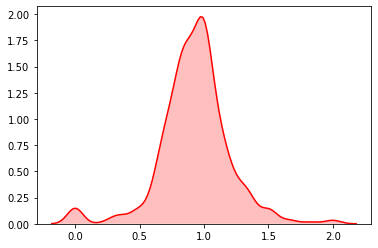

In [14]:
sns.kdeplot(avgScoreForTest, shade=True, color="r")
plt.show()

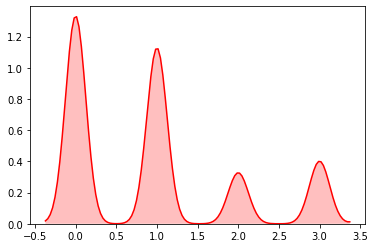

In [15]:
sns.kdeplot(totalAllScoresForTesting, shade=True, color="r")
plt.show()

### Testing Results using different alphas and gamma

0.1 0.5 [51, 0, 149]


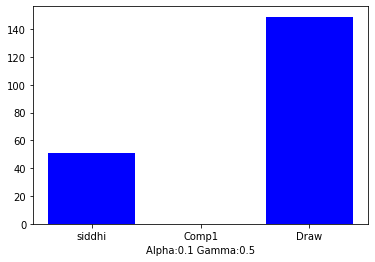

0.3 0.6 [47, 0, 153]


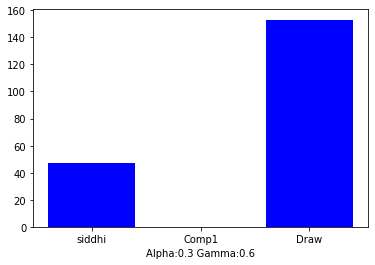

0.5 0.7 [62, 0, 138]


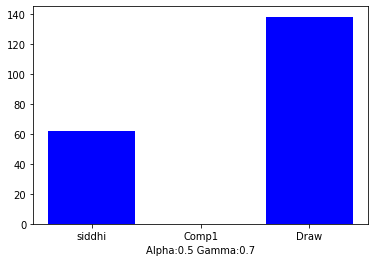

0.7 0.8 [70, 0, 130]


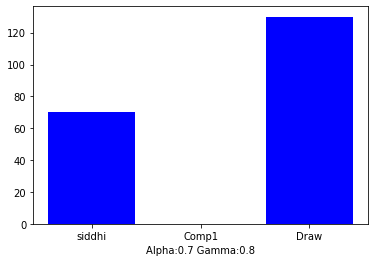

0.9 0.9 [60, 0, 140]


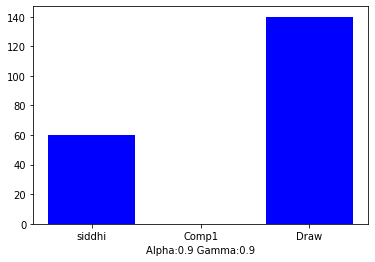

In [16]:
for i in range(len(alpha)):
    objects = ('siddhi', 'Comp1', 'Draw');
    y_pos = np.arange(len(objects))
    performance = [player1TrainWins[i], player2TrainWins[i], 200 - (player1TrainWins[i] + player2TrainWins[i])]
    print(alpha[i], gamma[i], performance)
    plt.bar(y_pos, performance, align='center', color='b')
    plt.xticks(y_pos, objects)
    x1 = 'Alpha:{} Gamma:{}'.format(alpha[i], gamma[i])
    plt.xlabel(x1)
    plt.show()

- Visualize the results and explain outputs (even from mine.)

In [17]:
%%bash 
cat grid.txt

OOOHOOOOO
OOOHOOHOO
OOOOOOHOO
OOOOHHHOO
OOHOOOOOH
OOHOOOGOO
OOOOOOOOO

In [18]:
class GridWorld:
    """ Grid World environment
            there are four actions (left, right, up, and down) to move an agent
            In a grid, if it reaches a goal, it get 30 points of reward.
            If it falls in a hole or moves out of the grid world, it gets -5.
            Each step costs -1 point. 

        to test GridWorld, run the following sample codes:

            env = GridWorld('grid.txt')

            env.print_map()
            print [2,3], env.check_state([2,3])
            print [0,0], env.check_state([0,0])
            print [3,4], env.check_state([3,4])
            print [10,3], env.check_state([10,3])

            env.init([0,0])
            print env.next(1)  # right
            print env.next(3)  # down
            print env.next(0)  # left
            print env.next(2)  # up
            print env.next(2)  # up

        Parameters
        ==========
        _map        ndarray
                    string array read from a file input
        _size       1d array
                    the size of _map in ndarray
        goal_pos    tuple
                    the index for the goal location
        _actions    list
                    list of actions for 4 actions
        _s          1d array
                    current state
    """
    def __init__(self, fn):
        # read a map from a file
        self._map = self.read_map(fn)
        self._size = np.asarray(self._map.shape)
        self.goal_pos = np.where(self._map == 'G')

        # definition of actions (left, right, up, and down repectively)
        self._actions = [[0, -1], [0, 1], [-1, 0], [1, 0]]
        self._s = None

    def get_cur_state(self):
        return self._s

    def get_size(self):
        return self._size

    def read_map(self, fn):
        grid = []
        with open(fn) as f:
            for line in f:
               grid.append(list(line.strip()))
        return np.asarray(grid)

    def print_map(self):
        print( self._map )

    def check_state(self, s):
        if isinstance(s, collections.Iterable) and len(s) == 2:
            if s[0] < 0 or s[1] < 0 or\
               s[0] >= self._size[0] or s[1] >= self._size[1]:
               return 'N'
            return self._map[tuple(s)].upper()
        else:
            return 'F'  # wrong input

    def init(self, state=None):
        if state is None:
            s = [0, 0]
        else:
            s = state

        if self.check_state(s) == 'O':
            self._s = np.asarray(state)
        else:
            raise ValueError("Invalid state for init")

    def next(self, a):
        s1 = self._s + self._actions[a]
        # state transition
        curr = self.check_state(s1)
        
        if curr == 'H' or curr == 'N':
            return -5
        elif curr == 'F':
            warnings.warn("invalid state " + str(s1))
            return -5
        elif curr == 'G':
            self._s = s1
            return 30
        else:
            self._s = s1
            return -1
        
    def is_goal(self):
        return self.check_state(self._s) == 'G'
            
    def get_actions(self):
        return self._actions

In [19]:
env = GridWorld("grid.txt")
env.print_map()

[['O' 'O' 'O' 'H' 'O' 'O' 'O' 'O' 'O']
 ['O' 'O' 'O' 'H' 'O' 'O' 'H' 'O' 'O']
 ['O' 'O' 'O' 'O' 'O' 'O' 'H' 'O' 'O']
 ['O' 'O' 'O' 'O' 'H' 'H' 'H' 'O' 'O']
 ['O' 'O' 'H' 'O' 'O' 'O' 'O' 'O' 'H']
 ['O' 'O' 'H' 'O' 'O' 'O' 'G' 'O' 'O']
 ['O' 'O' 'O' 'O' 'O' 'O' 'O' 'O' 'O']]


In [20]:
def coord_convert(s, sz):
    return [s[1], sz[0]-s[0]-1]

In [21]:
class RLAgent: 
    """
        Reinforcement Learning Agent Model for training/testing
        with Tabular function approximation
        
    """
    
    def __init__(self, evn):
        self.env = env
        self.size = env.get_size()
        self.n_a = len(env.get_actions())
        # self.Q table including the surrounding border
        self.Q = np.zeros((self.size[0], self.size[1], self.n_a))
    
    def epsilon_greed(self, epsilon, s):
        if np.random.uniform() < epsilon:
            a = np.random.randint(self.n_a)
        else:
            i_max = np.where(self.Q[s[0], s[1], :] == np.max(self.Q[s[0], s[1], :]))[0]
            a = int(np.random.choice(i_max))
        return a
    
    def train(self, start, **params):
        
        # parameters
        gamma = params.pop('gamma', 0.99)
        alpha = params.pop('alpha', 0.1)
        epsilon= params.pop('epsilon', 0.1)
        maxiter= params.pop('maxiter', 1000) 
        maxstep= params.pop('maxstep', 1000)
        
        # init self.Q matrix
        self.Q[...] = 0
        self.Q[self.env._map == 'H'] = -np.inf
        
        # online train
        # rewards and step trace
        rtrace = []
        steps = []
        for j in range(maxiter):

            env.init(start)
            s = env.get_cur_state()
            # selection an action
            a = self.epsilon_greed(epsilon, s)

            rewards = []
            trace = np.array(coord_convert(s, self.size))
            # run simulation for max number of steps 
            for step in range(maxstep):
                # move
                r = env.next(a)
                s1 = env.get_cur_state()
                a1 = self.epsilon_greed(epsilon, s1)

                rewards.append(r)
                trace = np.vstack((trace, coord_convert(s1, self.size)))

                # update self.Q table (SARSA)
                self.Q[s[0], s[1], a] += alpha * (r + gamma * self.Q[s1[0], s1[1], a1] -\
                                             self.Q[s[0], s[1], a])

                if env.is_goal(): # reached the goal
                    self.Q[s1[0], s1[1], a1] = 0
                    break

                s = s1
                a = a1

            rtrace.append(np.sum(rewards))
            steps.append(step+1)
        return rtrace, steps, trace # last trace of trajectory

    def test(self, start, maxstep=1000):
        epsilon = 0
        env.init(start)
        s = env.get_cur_state()
        # selection an action
        a = self.epsilon_greed(epsilon, s)

        trace = np.array(coord_convert(s, self.size))
        # run simulation for max number of steps 
        for step in range(maxstep):
            # move
            r = env.next(a)
            s1 = env.get_cur_state()
            a1 = self.epsilon_greed(epsilon, s1)

            trace = np.vstack((trace, coord_convert(s1, self.size)))

            if env.is_goal(): # reached the goal
                break

            s = s1
            a = a1 

        return trace         

In [22]:
### Plotting tools 

def plot_trace(agent, start, trace, title="test trajectory"):
    plt.plot(trace[:, 0], trace[:, 1], "ko-")
    plt.text(env.goal_pos[1], agent.size[0]-env.goal_pos[0]-1, 'G')
    plt.text(start[1], agent.size[0]-start[0]-1, 'S')
    plt.xlim([0, agent.size[1]])
    plt.ylim([0, agent.size[0]])
    

def plot_train(agent, rtrace, steps, trace, start):

    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(221)
    plt.plot(rtrace, "b-")
    plt.ylabel("sum of rewards")

    ax1 = fig.add_subplot(222)
    plt.plot(steps)
    plt.ylabel("# steps")

    # contour plot for agent.Q
    ax2 = fig.add_subplot(223)
    xs = range(agent.size[1])
    ys = range(agent.size[0])
    maxQ = np.max(agent.Q, axis=2)
    h_b = (maxQ==-np.inf)
    maxQ[h_b] = 0
    maxQ[h_b] = np.min(maxQ) - 100
    cs = plt.contourf(xs, ys[::-1], maxQ)
    plt.colorbar(cs)
    plt.text(env.goal_pos[1], agent.size[0]-env.goal_pos[0]-1, 'G')
    plt.text(start[1], agent.size[0]-start[0]-1, 'S')
    plt.ylabel("max agent.Q")

    # plot traces
    ax3 = fig.add_subplot(224)
    plot_trace(agent, start, trace, "trace of the last episode")

    plt.plot()

In [23]:
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, amma=0.99, 
                                   alpha=0.1, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:65: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working


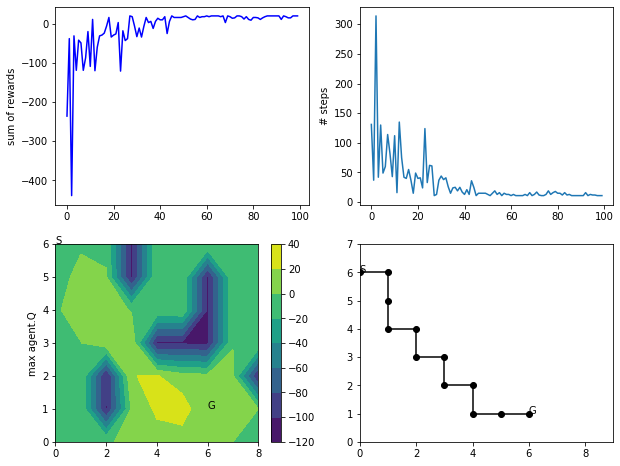

In [24]:
plot_train(agent, rtrace, steps, trace, start)

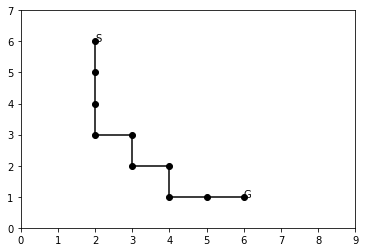

In [25]:
test_start = [0,2]
test_trace = agent.test(test_start)
plot_trace(agent, test_start, test_trace)

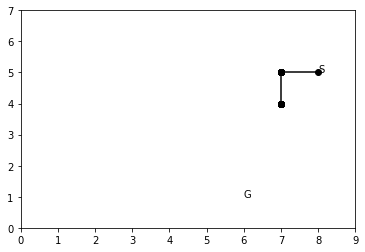

In [26]:
test_start = [1,8]
test_trace = agent.test(test_start)
plot_trace(agent, test_start, test_trace)

# IV - Results

- Describe the choice of your parameters for $\gamma$, $\alpha$, and $\epsilon$. 
  - Run experiments to find good parameters
  - Show the experimental outputs to show the process of your selection
- Visualize the results and explain outputs (even from mine.)
  - Run the codes and tell me what you observe
  - Add more visualizations to enrich your explanation.

#### Describe the choice of your parameters for $\gamma$, $\alpha$, and $\epsilon$. 
- I have  used 5 different values for the parameters alpha, gamma.
- For each of the 5 different values of parameters I have generated 5 different graphs where it shows the winning of  computer and player(Siddhi)
- For 0.5, 0.7 values seem to be best.

#### Visualize the results and explain outputs (even from mine.)

- On running the best parameters it was observed that after training the agent we are applying for testing and it is evident that the above results where the loss percent is higher because the learning isn't very good and most of the cases showed draw. This was because the agent was taking a lot of time for a large number of iterations. If we run the training for large number of Iteration the learning will increase and then the model will be able to perform better as it is all Reinforcement Learning as agent will be trained on more scenarios. 

# V. Conclusions

In this assignment of Reinforcement Learning I have learn the Temporal difference learning approaches, Q-learning and SARSA learning and their working. For Rummy agent I have selected Q-learning approach.
It was difficult to understand the flow of assignment and understand how to define the states and action of Rummy agent and update in Q-table.
From this assignment I understood the Q Learning Algorithm properly.


# References
1. “Notebook on Nbviewer.” Jupyter Notebook Viewer, https://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/notes/Note-ReinforcementLearning.Sol.ipynb.
2. https://www2.stetson.edu/~efriedma/research/finkle.pdf
3. https://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/slides/Reinforcement%20Learning.ipynb
4. https://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/notes/Note-NN%20for%20RL.ipynb

# Extra Credit for Tournament Top16!

- In two classes, we will have qualification and tournament.
- To participate the tournament, you need to use this [client](http://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/assign/StudentClient.ipynb) codes.
- Locally you can run the [server](http://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/assign/SERVER.ipynb) to verify your run. 

### Qualification Round 

- In qualification game, individual will play against a fixed policy agent on the server
  - You can access the server: TBA
  
  - Highly ranked (by the profit) will proceed to the tournament.
  - max. 32 players will be cut for main tournament (by 11 pm on Dec 1st).
  
### Tournament

- In tournament, 4 players will be play in each round.
  - In a table game, two best scoring players will proceed to next round
  - In final, the game will ends in 50 rounds and winner will be the one with lowest balance. 

## Grading

We will test your notebook with an additional grid.txt file. Please make sure to test in different maze input files. 

points | | description
--|--|:--
5 | Overview| states the objective and the appraoch 
35 | Methods | 
 |10| Review of the SARSA and Q-Learning
 | 5| Choice of TD learning and Reason
 | 5| Choice of Function Approximation and Reason
 |10| Implementation of the selected approach (RLAgent)
 | 5| explanation of the codes
45 | Results 
 |10| Reports the selected parameters 
 |15| Experimental outputs that show the choice of parameters. How do you choose them?
 |10| Output plots (5 for each)
 |10| reading and analysis of learning results and plots
10 | Participation to the tournament.
5 | Conclusions 
